## Libraries

In [2]:
import scipy.io as sio
import pandas as pd
import numpy as np
import os
import mne
import matplotlib.pyplot as plt
import igraph as ig
import scipy
import itertools

from sklearn.cluster import KMeans
from numpy.core._multiarray_umath import ndarray
from scipy.signal import butter, cheby1, filtfilt
from matplotlib.colors import TwoSlopeNorm
from copy import deepcopy
from functools import partial
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from scipy import spatial

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
os.chdir('/Users/romankarski/Documents/Documents_v2/Projects/EEG/thesis/')

In [5]:
from src.utils.utils import *

In [6]:
config_path=os.path.join("src/config/config_eeg.yaml")
config = load_config(config_path=config_path)

In [7]:
def cos_similarity(array1, array2):
    return -1 * (spatial.distance.cosine(array1, array2) - 1)

In [8]:
def locmax(x):
    """Get local maxima of 1D-array

    Args:
        x: numeric sequence
    Returns:
        m: list, 1D-indices of local maxima
    """

    dx = np.diff(x) # discrete 1st derivative
    zc = np.diff(np.sign(dx)) # zero-crossings of dx
    m = 1 + np.where(zc == -2)[0] # indices of local max.
    return m

# Intro

In [9]:
channels, eeg_raw_signals = load_eeg_data(config=config,
                                        participant_id=28)

df_coordinates = get_coordinates(config=config, channels=channels)
df_distances = get_distances(df_coordinates)
df_frequencies = get_frequency_bands()
minimal_frequency = np.min([low for low, _ in df_frequencies.values()])
maximal_frequency = np.max([high for _, high in df_frequencies.values()])
sampling_frequency = config['experiment']['frequency']

df_tasks = load_tasks(config=config)
df_markers = load_markers(config=config)
df_marker_task = df_tasks.merge(df_markers, on=['participant_id', 'task_order'])
df_marker_task = extend_markers(config=config, df_marker=df_marker_task)
df_annotations = prepare_annotations(config=config, df_marker_task=df_marker_task)

eeg_raw_signals_trasformed = eeg_raw_signals.copy()
simulated_raw = {}
for i, row in eeg_raw_signals.iterrows():
    df_single_annotation = df_annotations[df_annotations['participant_id']==row['participant_id']]
    single_annotation = mne.Annotations(df_single_annotation['timestamp'].tolist(),
                                        df_single_annotation['duration'].tolist(),
                                        df_single_annotation['description'].tolist())
    annotation_intervals = [(int(annotation['onset']*250), int(annotation['onset']+annotation['duration'])*250) for annotation in single_annotation]
    annotation_mask = np.zeros(row['raw_signal'].shape[1], dtype=bool)
    ordered_annotation_mask = np.zeros(row['raw_signal'].shape[1], dtype=int)
    for low, high in annotation_intervals:
        annotation_mask[low:high] = True
    for i, (low, high) in enumerate(annotation_intervals):
        ordered_annotation_mask[low:high] = i+1

    fake_eeg = Fake_eeg(row['raw_signal'], channels)
    # fake_eeg.apply_func(func=partial(normalize_raw,
    #                                  annotation_mask=annotation_mask))
    fake_eeg.apply_func(func=partial(butter_filter,
                                     annotation_mask=annotation_mask,
                                     minimal_frequency=minimal_frequency,
                                     maximal_frequency=maximal_frequency,
                                     sampling_frequency=sampling_frequency,
                                     order=5))
    fake_eeg.apply_func(func=partial(distance_laplace,
                                     df_distances=df_distances))
    fake_eeg.apply_func(func=partial(iqr_filter,
                                     annotation_mask=annotation_mask,
                                     k=2))
    eeg_raw_signals_trasformed['raw_signal'].loc[i] = fake_eeg.to_raw_signal()

    simulated_raw.update({row['participant_id']: prepare_mne_array(config=config,
                                            channels=channels,
                                            raw_eeg_signal=fake_eeg.to_raw_signal(),
                                            annotation_mask=annotation_mask,
                                            ordered_annotation_mask=ordered_annotation_mask)})
    simulated_raw[row['participant_id']].set_annotations(single_annotation)

for participant in list(simulated_raw.keys()):
    simulated_raw[participant].set_montage(config.get('experiment').get('montage'))
    simulated_raw[participant]._set_channel_positions(df_coordinates[['x', 'y', 'z']].values, names=channels)
    simulated_raw[participant].generate_normalized_dataframe()
    simulated_raw[participant].calculated_grouped_mean(60)

for participant in list(simulated_raw.keys()):
    df_single_annotation = df_annotations[df_annotations['participant_id']==participant]
    single_annotation = mne.Annotations(df_single_annotation['timestamp'].tolist(),
                                                df_single_annotation['duration'].tolist(),
                                                df_single_annotation['description'].tolist())
    simulated_raw[participant].set_annotations(single_annotation)
    

Creating RawArray with float64 data, n_channels=30, n_times=246352
    Range : 0 ... 246351 =      0.000 ...   985.404 secs
Ready.


In [10]:
raw = simulated_raw[28]

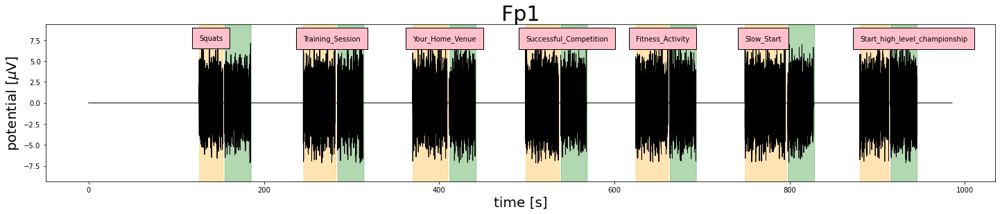

In [11]:
plot_channel(raw, annotations=raw._annotations, channel='Fp1')

# FOR CLUSTERING PREPARATION

In [12]:
n_channels = len(raw.ch_names)
n_clusters = 4
step = 60

In [13]:
raw_data = raw[:][0][:,raw.annotation_mask]
# Znalezienie najwiekszych odchylen standardowych na kanałach
gfp_channel = np.nanstd(raw_data, axis=1)
gfp_constant = np.sum(gfp_channel**2)
gfp_peaks = locmax(gfp_channel)
# Wybor tylko kanalow z najwiekszym wahaniem
data_cluster = raw_data[gfp_peaks,:]

In [14]:
# Usuniecie normalizacja 
data_cluster_norm = data_cluster - data_cluster.mean(axis=1, keepdims=True)
data_cluster_norm /= data_cluster_norm.std(axis=1, keepdims=True)

In [15]:
# przygotowanie PCA
params = {
    "n_components": n_clusters,
    "copy": True,
    "whiten": True,
    "svd_solver": "auto",
}
pca = PCA(**params) # SKLEARN
pca.fit(data_cluster_norm)
# Zebranie wyniku na 4 cechach
maps = np.array([pca.components_[k,:] for k in range(n_clusters)])

In [16]:
# Normalizacja mapowania na cechy z PCA
maps_norm = maps - maps.mean(axis=1, keepdims=True)
maps_norm /= maps_norm.std(axis=1, keepdims=True)

In [17]:
# Podzial sygnalu na annotacje
annotation_raw_signals = [raw[:][0][:, raw.ordered_annotation_mask==i] for i in range(1, np.max(raw.ordered_annotation_mask)+1)]

In [381]:
# 0 to sygnal pomiedzy interesujacymi nas regionami i go odrzucamy
pd.DataFrame(raw.ordered_annotation_mask).value_counts()

0     130934
11     11510
5       9801
7       9327
9       9210
3       9025
13      8232
14      7482
2       7479
10      7460
8       7327
6       7301
4       7275
12      7260
1       6729
dtype: int64

In [384]:
annotation_signal_step_mean = {annotation_order:[annotation[:,i-step:i].mean(axis=1) for i in range(step, annotation.shape[1]+1, step)] for annotation_order, annotation in enumerate(annotation_raw_signals)}

In [385]:
annotations_signal_step_mean_list = [x for list in list(annotation_signal_step_mean.values()) for x in list]

In [388]:
mesh_step_mean_list = [create_moment_topography(config=config, moment_signal={channel: value for channel, value in zip(raw.ch_names, annotation_step_mean_)}, df_coordinates=df_coordinates) for annotation_step_mean_ in annotations_signal_step_mean_list]

In [389]:
mesh_step_mean_list_flat = [np.array(mesh).flatten() for mesh in mesh_step_mean_list] 

In [390]:
maps_norm_step_mean = {annotation_order: [maps_norm[:, i-step:i].mean(axis=1) for i in range(step, annotation.shape[1]+1, step)] for annotation_order, annotation in enumerate(annotation_raw_signals)}

In [391]:
maps_norm_step_mean_list = [x for list in list(maps_norm_step_mean.values()) for x in list]

# KMEANS SEARCHING

In [437]:
def kmeans_microstates(signal_for_kmeans, signal_for_maps, signal_for_microstates, config, raw, df_coordinates, n_clusters=4):
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(signal_for_kmeans)
    signal_labels = kmeans.labels_

    # surowe dane na kazdym z oznaczen
    raw_data_per_label = {i:np.array(signal_for_maps).T[:, signal_labels==i] for i in range(n_clusters)}

    # obliczenie srednich na oznaczenie
    mean_data_per_label = {i: data.mean(axis=1) for i, data in raw_data_per_label.items()}

    # wizualizacja microstanow
    for label, mean_ in mean_data_per_label.items():
        mesh = create_moment_topography(config=config, moment_signal={channel: value for channel, value in zip(raw.ch_names, mean_)}, df_coordinates=df_coordinates)
        head_copy = raw.plot_sensors(show_names=True, ch_type='eeg', sphere=(0,0,0,1.1), show=False, verbose=0)
        plt.close()
        plot_topography(config=config, mesh=mesh, head_figure=head_copy)

    kmeans_own = KMeans(n_clusters=4, init=[mean_ for label, mean_ in mean_data_per_label.items()], n_init=1)
    kmeans_own.fit([mean_ for label, mean_ in mean_data_per_label.items()])

    microstates_step_mean_kmeans = {annotation_order:kmeans_own.predict(annotation) for annotation_order, annotation in signal_for_microstates.items()}
    # sparwdzenie per annotacje
    print([len(x) for x  in list(microstates_step_mean_kmeans.values())])

    return microstates_step_mean_kmeans

[112, 124, 150, 121, 163, 121, 155, 122, 153, 124, 191, 121, 137, 124]


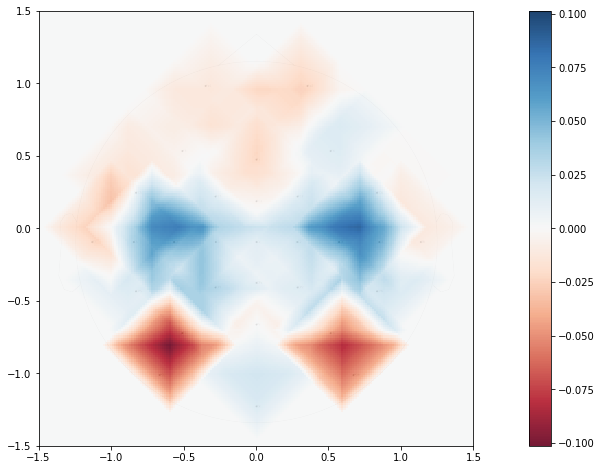

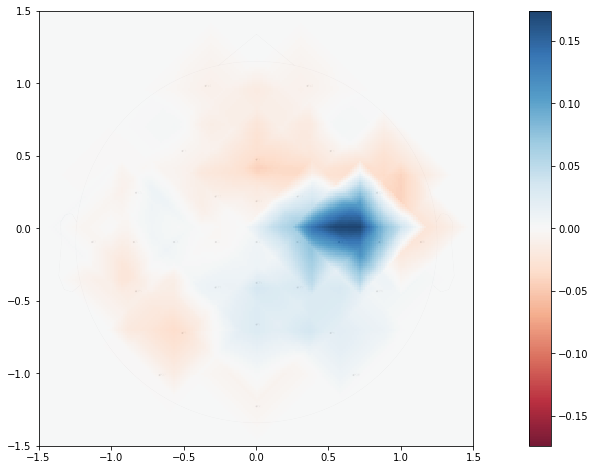

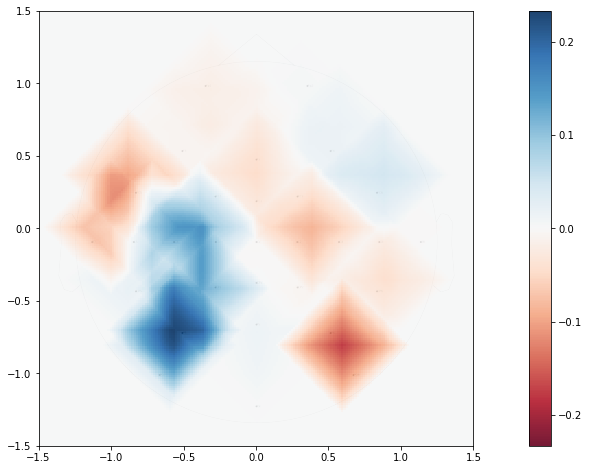

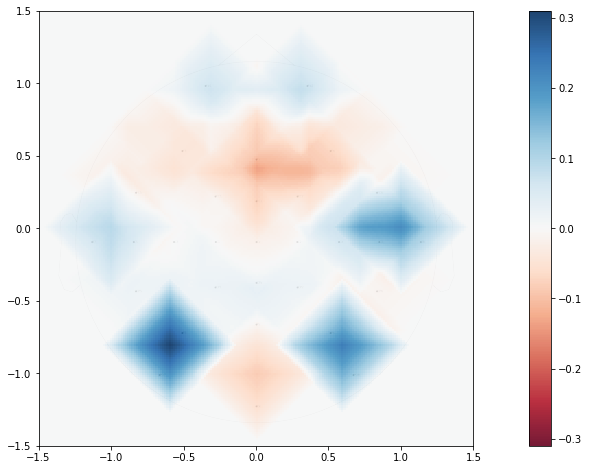

In [438]:
microstates_step_mean_kmeans = kmeans_microstates(signal_for_kmeans = maps_norm_step_mean_list,
                                                signal_for_maps = annotations_signal_step_mean_list,
                                                signal_for_microstates = annotation_signal_step_mean,
                                                config = config,
                                                raw = raw,
                                                df_coordinates=df_coordinates,
                                                n_clusters = 4)

# TREATED AS AN IMAGE 

In [468]:
def cos_microstates(signal_for_cos, signal_for_microstates, config, raw, df_coordinates, n_clusters=4, signal_for_visualization=None):

    cos_similarities = [np.concatenate([np.zeros(i1), [cos_similarity(map1, map2) for _, map2 in enumerate(signal_for_cos[i1:])]]) for i1, map1 in enumerate(signal_for_cos)]

    cos_similarities_df = pd.DataFrame(cos_similarities)
    cos_similarities_df[cos_similarities_df==1] = 0

    df_ids = pd.DataFrame(cos_similarities_df.T.apply('idxmax', axis=0)).reset_index().rename({"index": "id1", 0:"id2"}, axis=1)
    df_ids["similarity"] = df_ids.apply(lambda x: cos_similarities_df.iloc[x.id1, x.id2], axis=1)
    df_ids['similarity'].hist()
    df_filter_ids = df_ids[df_ids['similarity']>df_ids['similarity'].quantile(0.37)]

    g = ig.Graph()
    g.add_vertices(df_ids['id1'].values)
    g.add_edges([(x[0], x[1]) for x in df_filter_ids[["id1", "id2"]].values])
    components = g.connected_components()

    # Visualise different components
    fig, ax = plt.subplots(figsize=(10, 10))
    ig.plot(
        components,
        target=ax,
        palette=ig.RainbowPalette(),
        vertex_size=0.1,
        vertex_color=list(map(int, ig.rescale(components.membership, (0, 200), clamp=True))),
        edge_width=0.9
    )
    plt.show()

    df_filter_ids['membership'] = pd.DataFrame(components.membership).loc[df_filter_ids.index].values.reshape(-1)

    top_members = df_filter_ids['membership'].value_counts()
    top_members = top_members[top_members>10]
    top_members_df = pd.DataFrame({'membership_id': top_members.index.get_level_values(0), 'count': top_members.values})
    top_members_df['mean_similarity'] = [df_filter_ids[df_filter_ids['membership']==member]['similarity'].mean() for member in top_members_df['membership_id'].values]

    scaler = MinMaxScaler()
    top_members_df['count_scaled'] = scaler.fit_transform(top_members_df['count'].values.reshape(-1,1)).reshape(-1)
    top_members_df['result'] = top_members_df['mean_similarity'] * top_members_df['count_scaled']
    top_membership_ids = top_members_df.sort_values('result', ascending=False)[:4]['membership_id'].values
    df_top_ids = df_filter_ids[df_filter_ids['membership'].isin(top_membership_ids)]

    membership_means = {}
    for i, membership_id in enumerate(top_membership_ids):
        annotation_ids = list(set(df_top_ids[df_top_ids["membership"]==membership_id]['id1'].values).union(set(df_top_ids[df_top_ids["membership"]==membership_id]['id2'].values)))
        annotation_array = np.array([signal_for_cos[id_] for id_ in annotation_ids])
        membership_means[i] = annotation_array.mean(axis=0)

    visualization = True
    if np.array(signal_for_cos).shape[1] == len(raw.ch_names):
        membership_means_all_channels = membership_means
    elif not signal_for_visualization is None:
        membership_means_all_channels = {}
        for i, membership_id in enumerate(top_membership_ids):
            annotation_ids = list(set(df_top_ids[df_top_ids["membership"]==membership_id]['id1'].values).union(set(df_top_ids[df_top_ids["membership"]==membership_id]['id2'].values)))
            annotation_array = np.array([signal_for_visualization[id_] for id_ in annotation_ids])
            membership_means_all_channels[i] = annotation_array.mean(axis=0)
    else:
        visualization = False

    if visualization:
        for label, mean_ in membership_means_all_channels.items():
            mesh = create_moment_topography(config=config, moment_signal={channel: value for channel, value in zip(raw.ch_names, mean_)}, df_coordinates=df_coordinates)
            head_copy = raw.plot_sensors(show_names=True, ch_type='eeg', sphere=(0,0,0,1.1), show=False, verbose=0)
            plt.close()
            plot_topography(config=config, mesh=mesh, head_figure=head_copy)

    microstates_step_mean_cos = {annotation_order: np.array([np.array([cos_similarity(map_, map_mean) for _, map_mean in membership_means.items()]).argmax() for map_ in annotations]) 
                                for annotation_order, annotations in signal_for_microstates.items()}

    kmeans_own_cos = KMeans(n_clusters=n_clusters, init=[mean_ for label, mean_ in membership_means.items()], n_init=1)
    kmeans_own_cos.fit([mean_ for label, mean_ in membership_means.items()])

    microstates_step_mean_kmean_cos = {annotation_order: kmeans_own_cos.predict(annotation) 
                                for annotation_order, annotation in signal_for_microstates.items()}

    print([len(x) for x  in list(microstates_step_mean_cos.values())])
    print([len(x) for x  in list(microstates_step_mean_kmean_cos.values())])

    return microstates_step_mean_cos, microstates_step_mean_kmean_cos

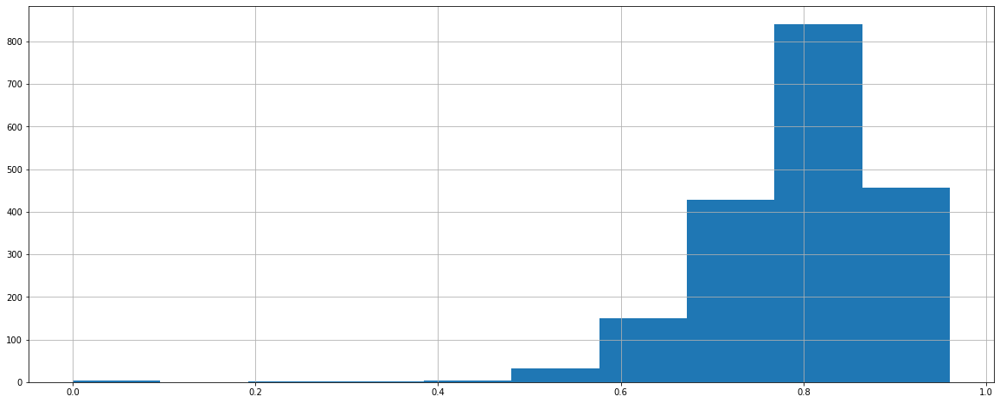

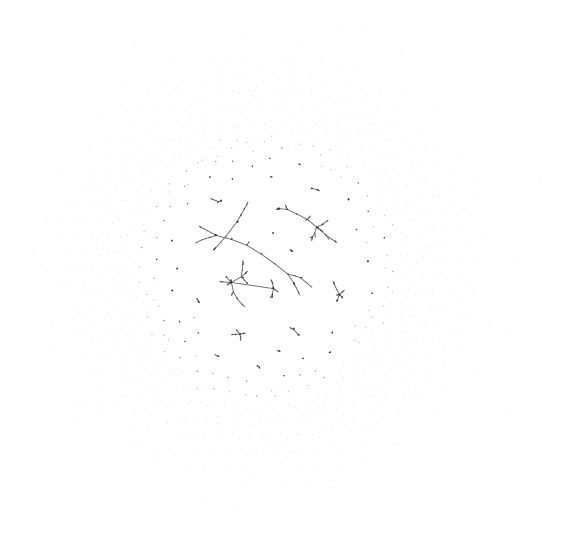

/var/folders/2d/_448g6ld0330c03f38wpcyvm0000gn/T/ipykernel_17499/1506806374.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_ids['membership'] = pd.DataFrame(components.membership).loc[df_filter_ids.index].values.reshape(-1)


[112, 124, 150, 121, 163, 121, 155, 122, 153, 124, 191, 121, 137, 124]
[112, 124, 150, 121, 163, 121, 155, 122, 153, 124, 191, 121, 137, 124]


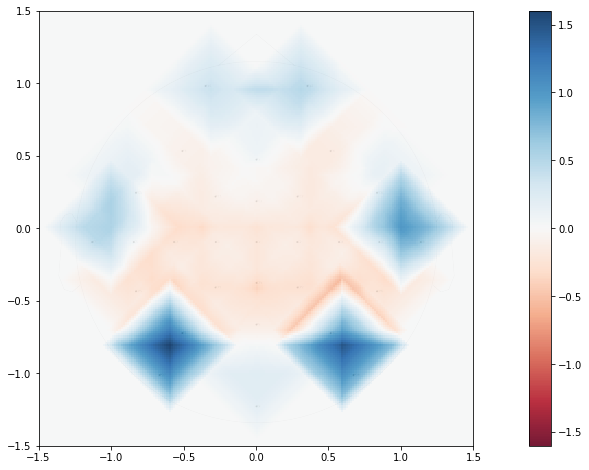

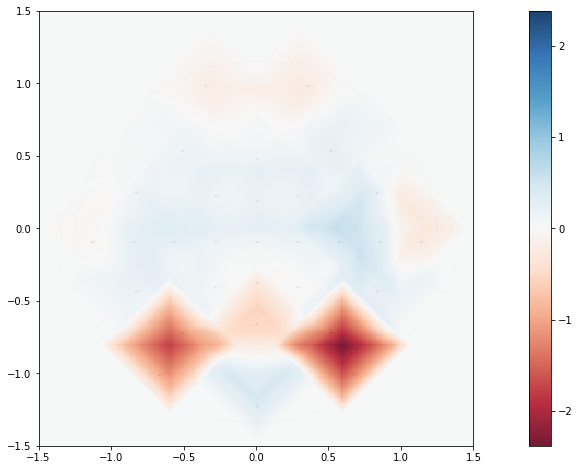

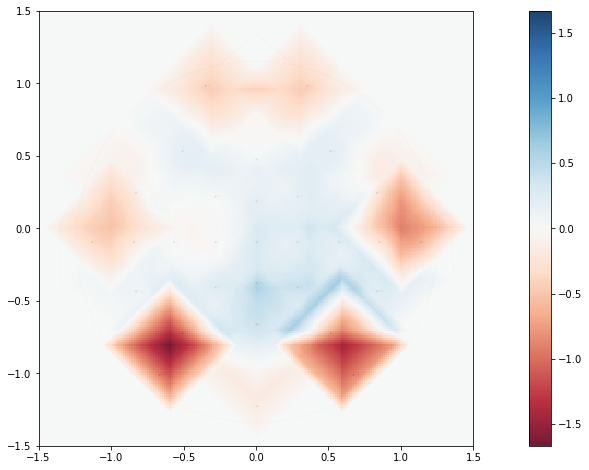

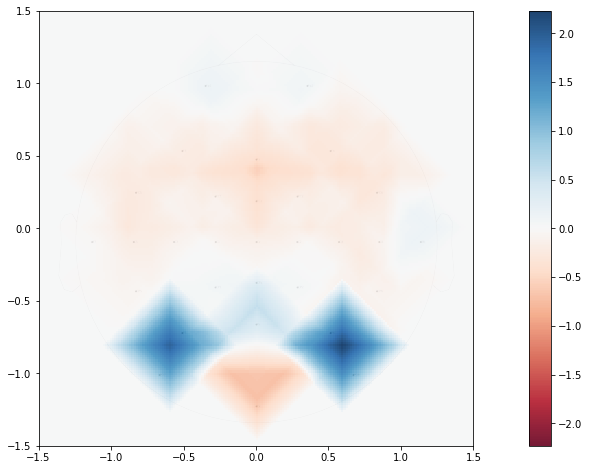

In [461]:
microstates_step_mean_cos, microstates_step_mean_kmean_cos = cos_microstates(signal_for_cos = annotations_signal_step_mean_list,
                                                                            signal_for_microstates = annotation_signal_step_mean,
                                                                            config = config,
                                                                            raw = raw,
                                                                            df_coordinates=df_coordinates,
                                                                            n_clusters = 4)

# TREATED AS AN IMAGE with PCA

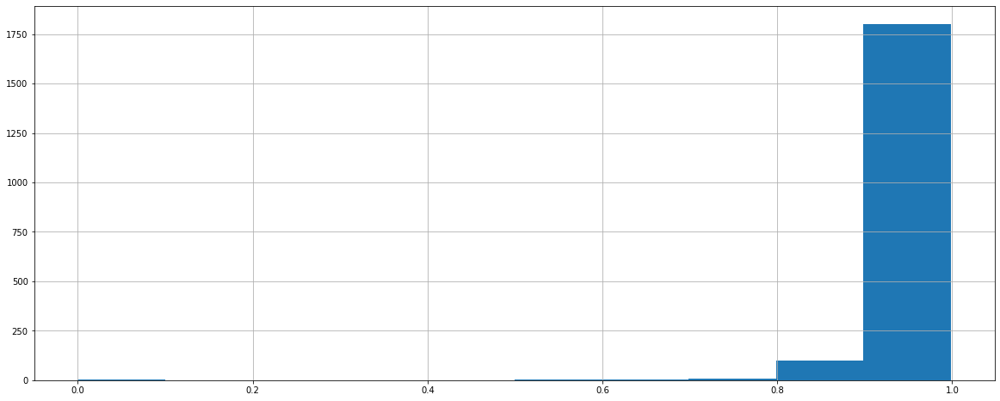

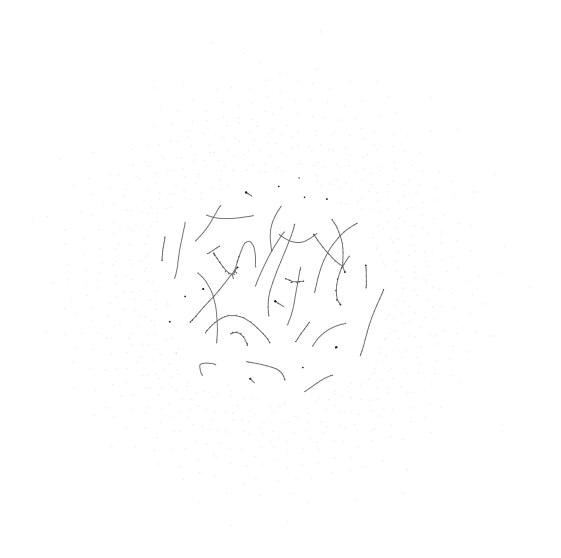

/var/folders/2d/_448g6ld0330c03f38wpcyvm0000gn/T/ipykernel_17499/3685931312.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_ids['membership'] = pd.DataFrame(components.membership).loc[df_filter_ids.index].values.reshape(-1)


[112, 124, 150, 121, 163, 121, 155, 122, 153, 124, 191, 121, 137, 124]
[112, 124, 150, 121, 163, 121, 155, 122, 153, 124, 191, 121, 137, 124]


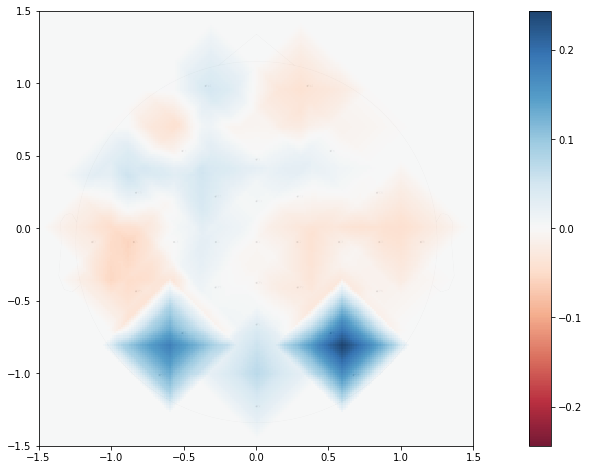

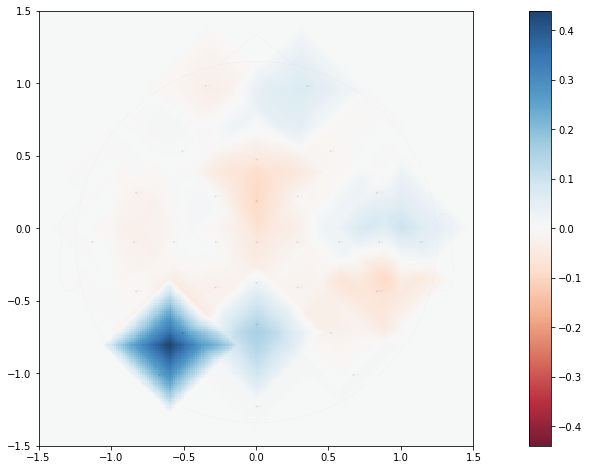

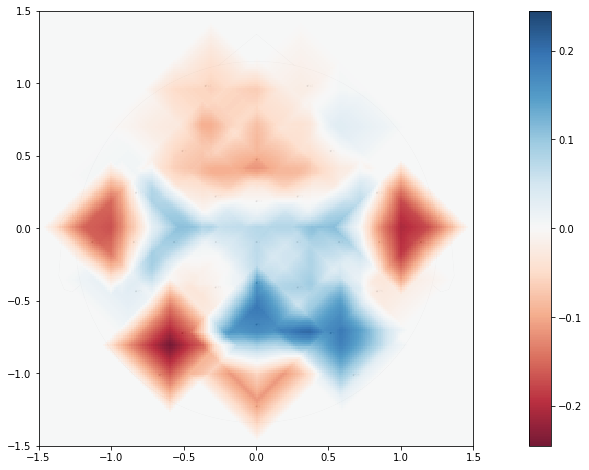

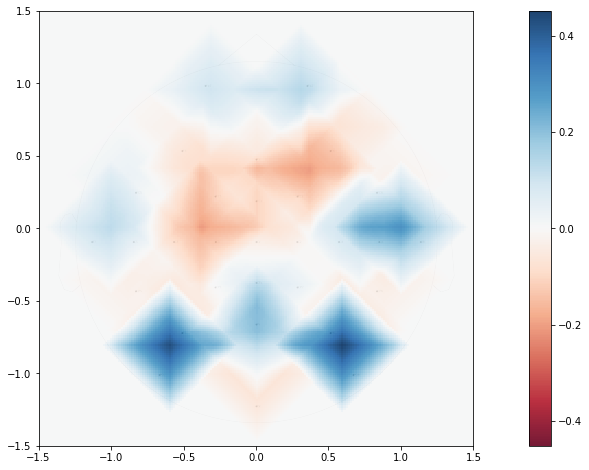

In [469]:
microstates_step_mean_pca_cos, microstates_step_mean_kmean_pca_cos = cos_microstates(signal_for_cos = maps_norm_step_mean_list,
                                                                            signal_for_microstates = maps_norm_step_mean,
                                                                            config = config,
                                                                            raw = raw,
                                                                            df_coordinates=df_coordinates,
                                                                            n_clusters = 4,
                                                                            signal_for_visualization = annotations_signal_step_mean_list)

# Microstates

In [429]:
df_60_kmeans = pd.DataFrame.from_dict(microstates_step_mean_kmeans, orient='index').stack().reset_index().drop('level_1', axis=1).rename({'level_0':'annotation', 0:'label'}, axis=1).astype(int)

In [60]:
df_kmeans = pd.DataFrame.from_dict(microstates_step_mean_kmeans, orient='index').stack().reset_index().drop('level_1', axis=1).rename({'level_0':'annotation', 0:'label'}, axis=1).astype(int)
df_cos = pd.DataFrame.from_dict(microstates_step_mean_cos, orient='index').stack().reset_index().drop('level_1', axis=1).rename({'level_0':'annotation', 0:'label'}, axis=1).astype(int)
df_kmeans_cos = pd.DataFrame.from_dict(microstates_step_mean_kmean_cos, orient='index').stack().reset_index().drop('level_1', axis=1).rename({'level_0':'annotation', 0:'label'}, axis=1).astype(int)
df_cos_pca = pd.DataFrame.from_dict(microstates_step_mean_pca_cos, orient='index').stack().reset_index().drop('level_1', axis=1).rename({'level_0':'annotation', 0:'label'}, axis=1).astype(int)
df_kmeans_cos_pca = pd.DataFrame.from_dict(microstates_step_mean_kmean_pca_cos, orient='index').stack().reset_index().drop('level_1', axis=1).rename({'level_0':'annotation', 0:'label'}, axis=1).astype(int)

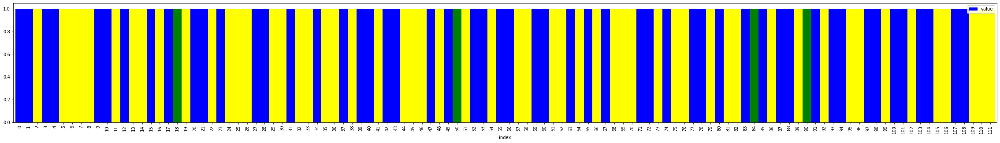

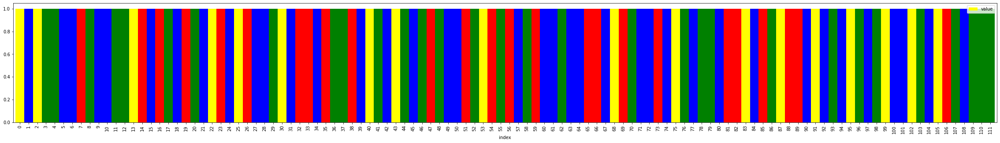

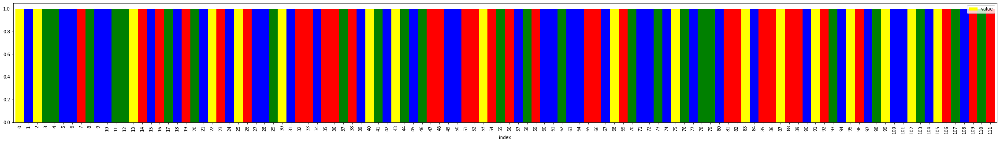

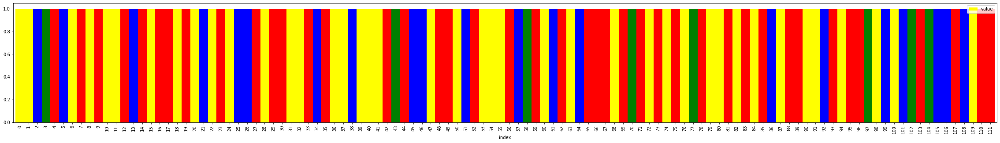

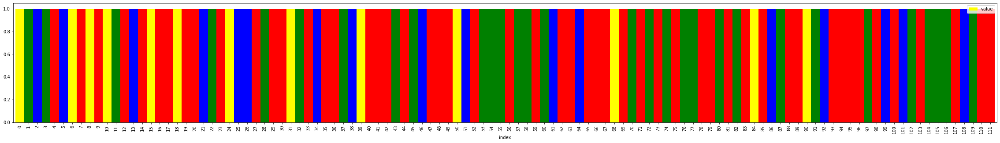

...

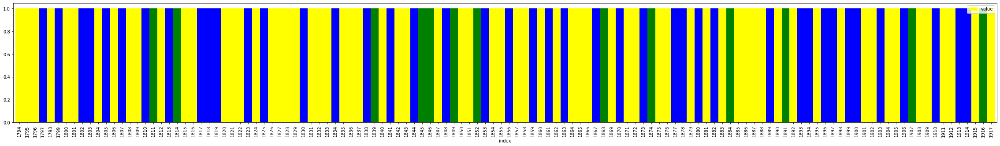

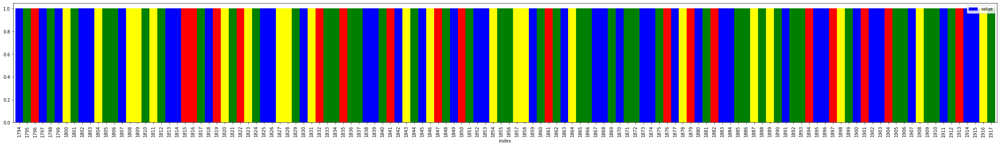

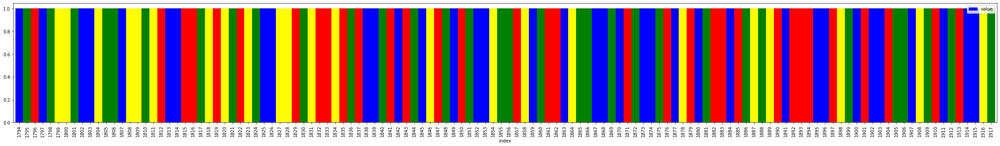

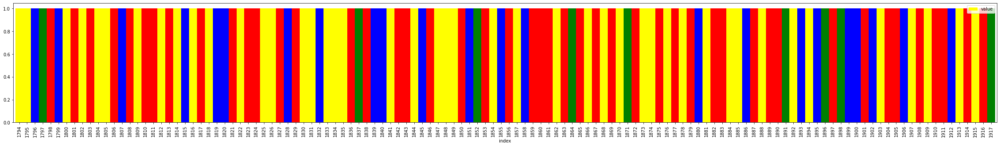

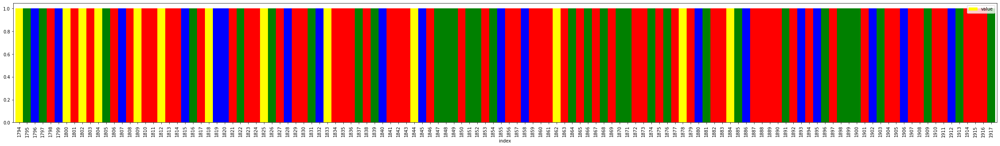

In [62]:
for annotation in df_kmeans.annotation.unique():
    for df in [df_kmeans, df_cos, df_kmeans_cos, df_cos_pca, df_kmeans_cos_pca]:
        plot_labels(df[df['annotation']==annotation].copy(), limit=200)

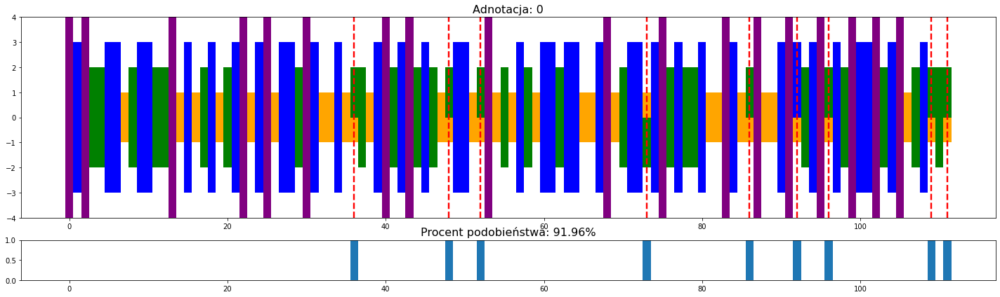

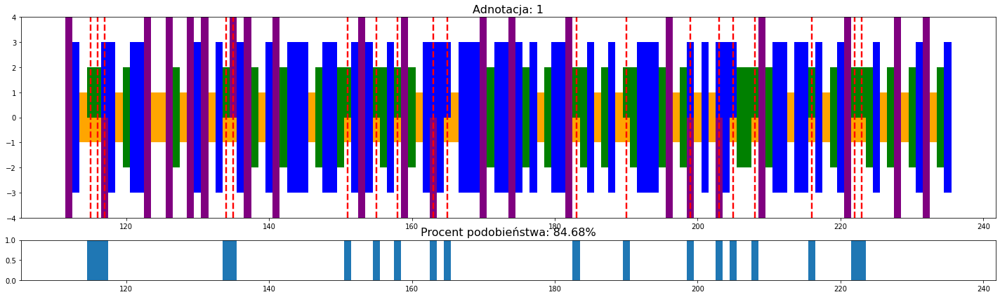

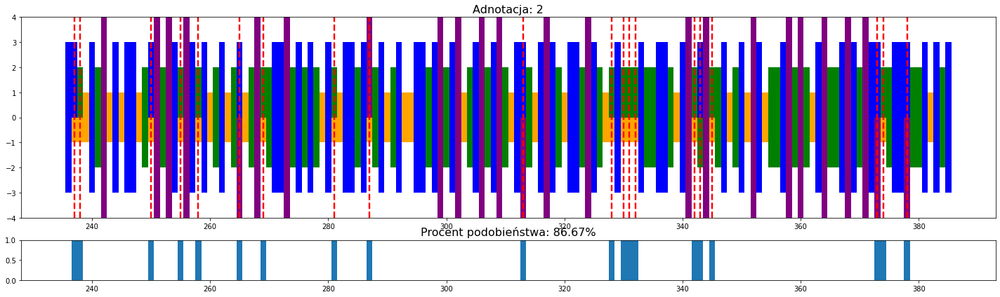

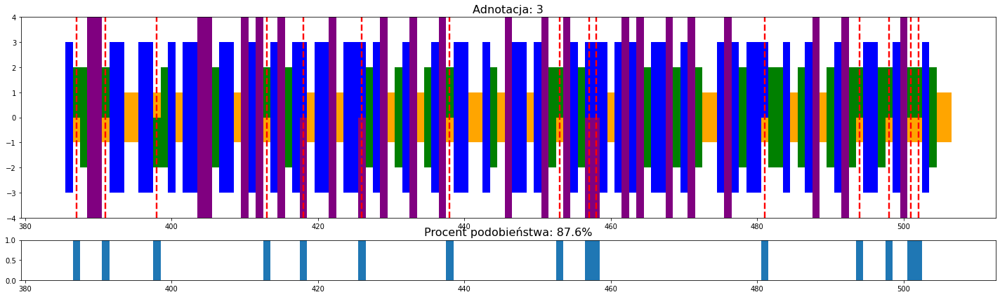

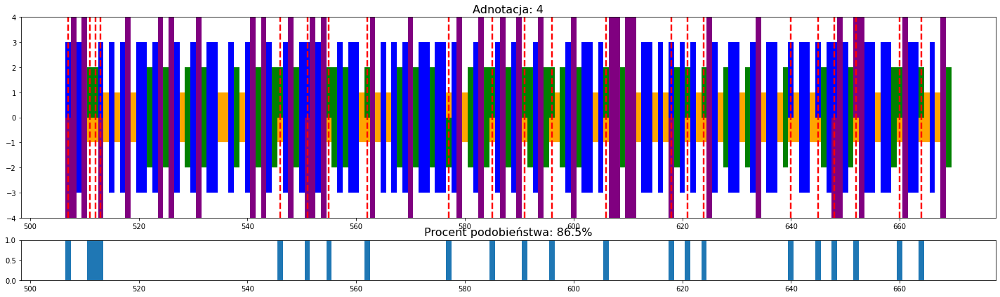

...

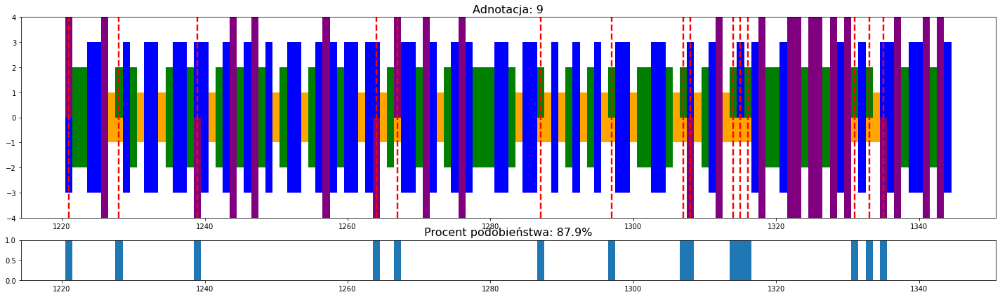

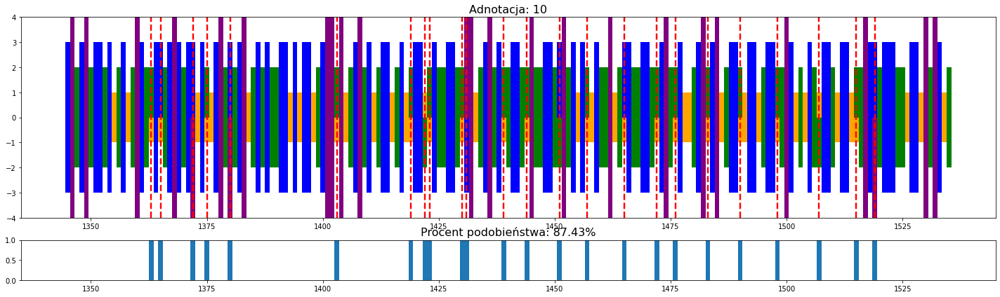

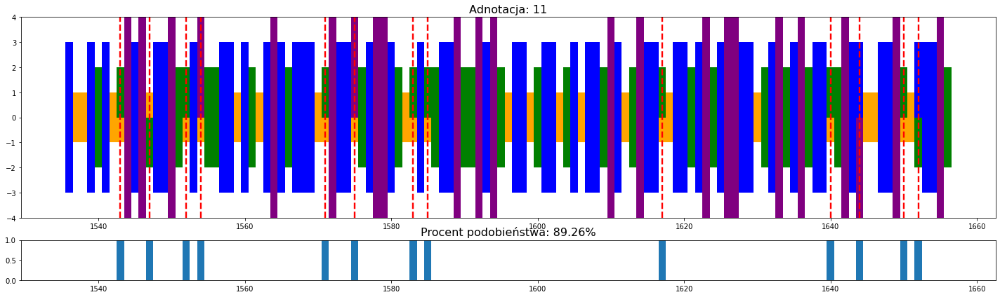

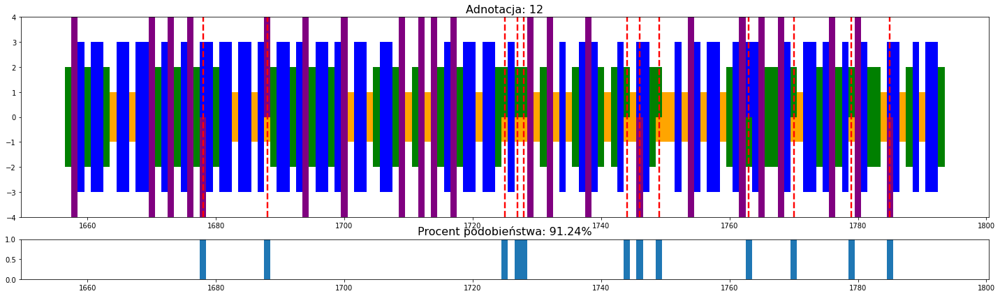

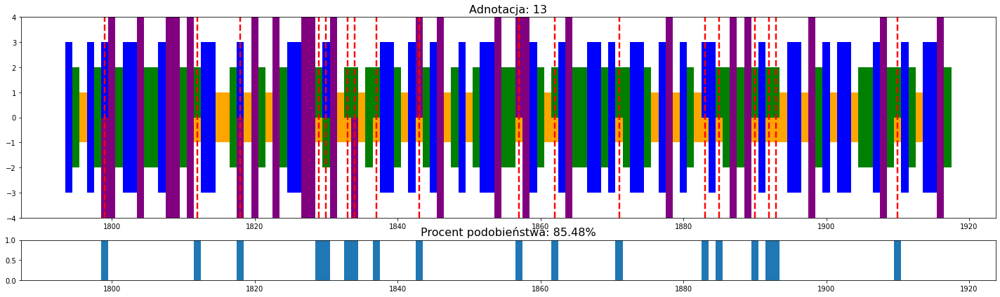

In [65]:
for annotation in df_kmeans.annotation.unique():
    compare_labels(df_cos[df_cos['annotation']==annotation], df_kmeans_cos[df_kmeans_cos['annotation']==annotation])

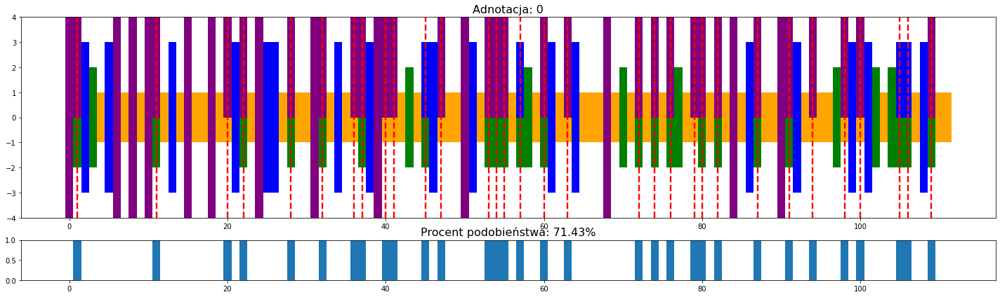

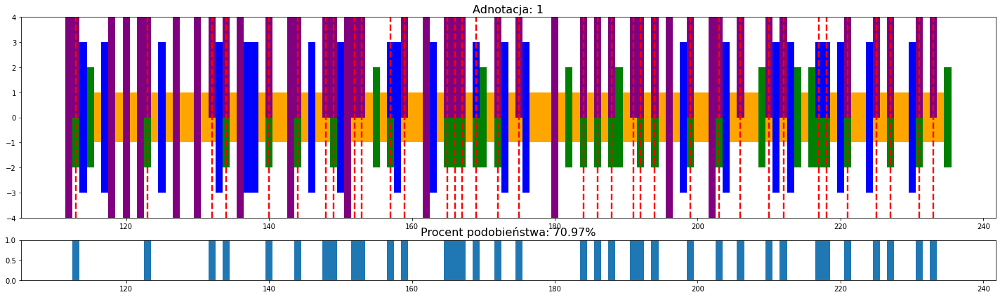

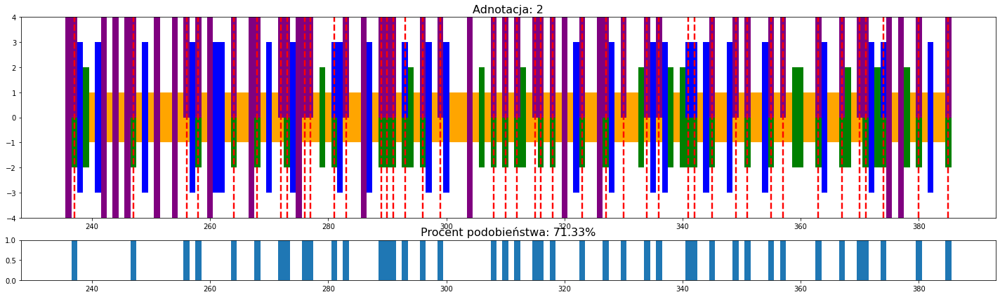

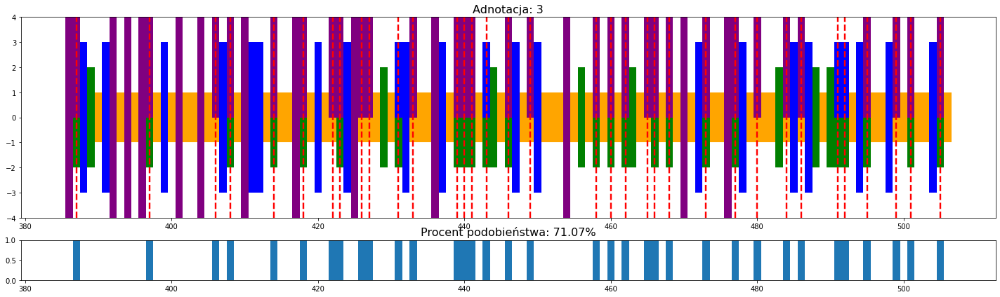

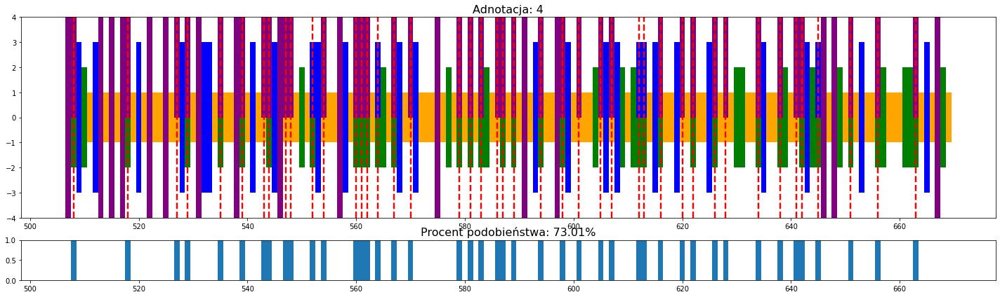

...

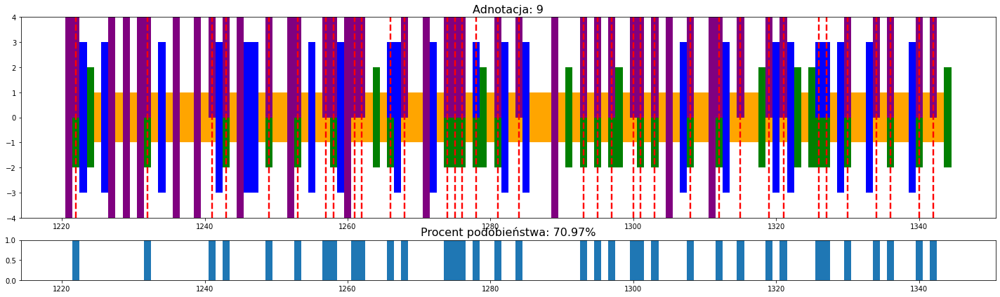

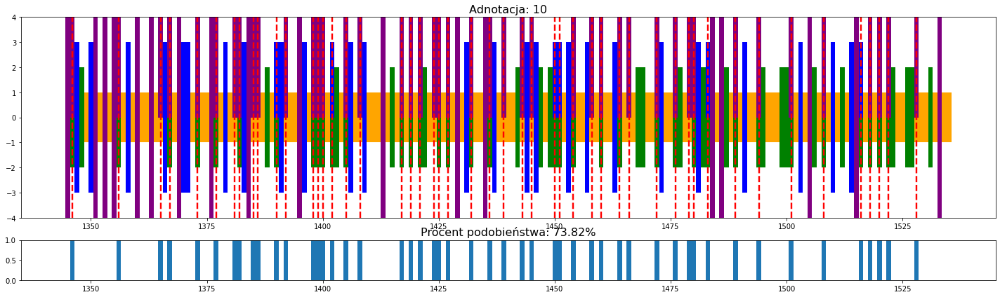

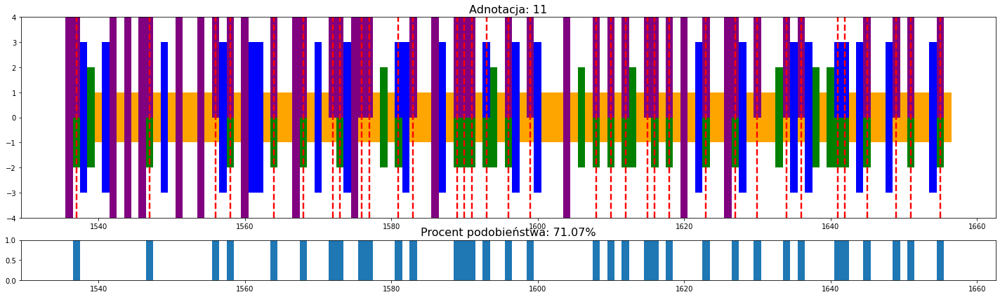

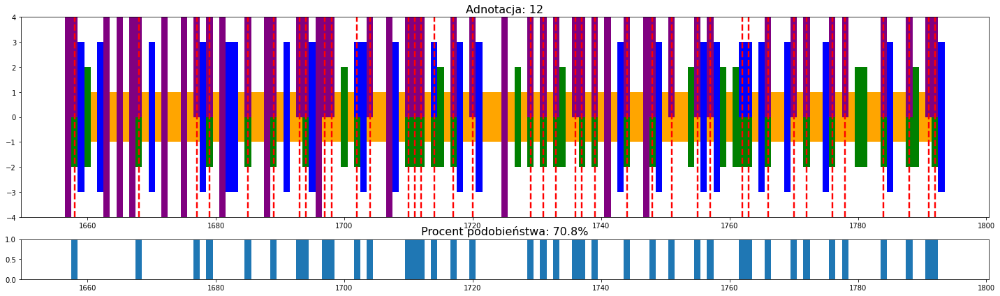

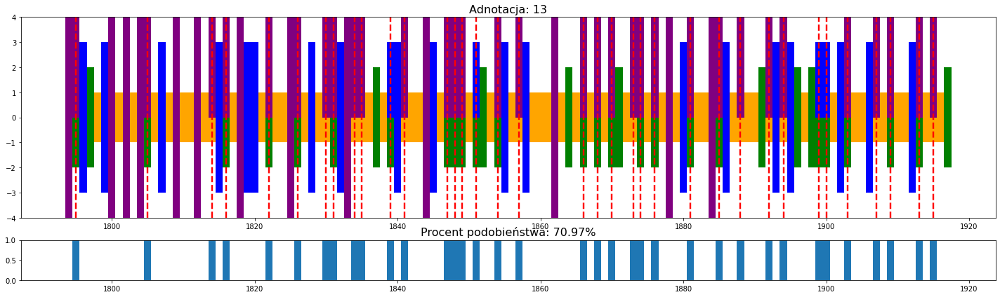

In [66]:
for annotation in df_kmeans.annotation.unique():
    compare_labels(df_cos_pca[df_cos_pca['annotation']==annotation], df_kmeans_cos_pca[df_kmeans_cos_pca['annotation']==annotation])

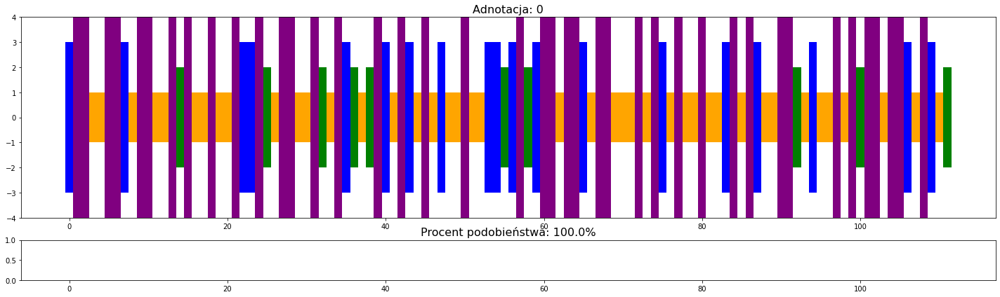

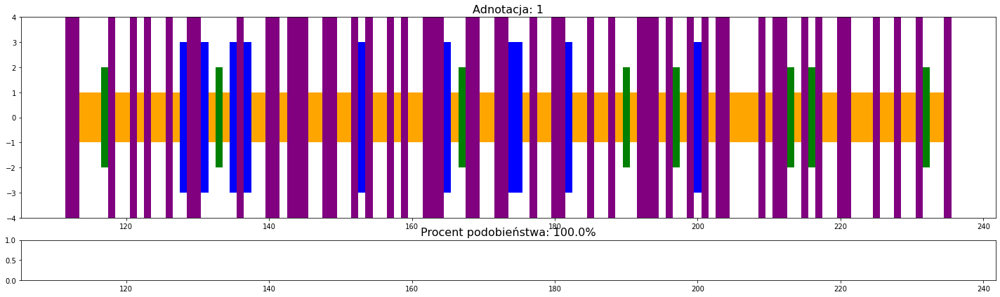

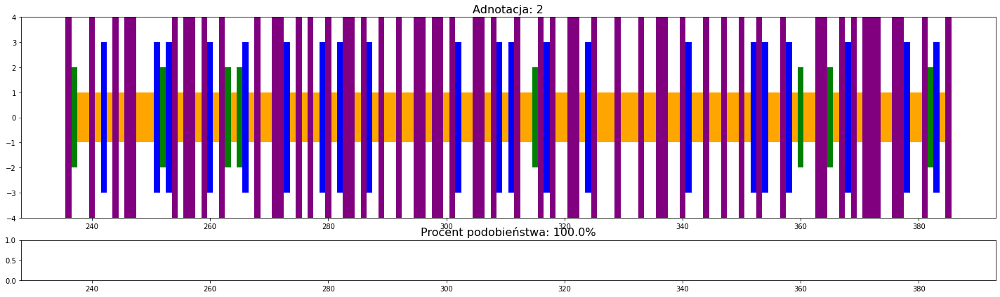

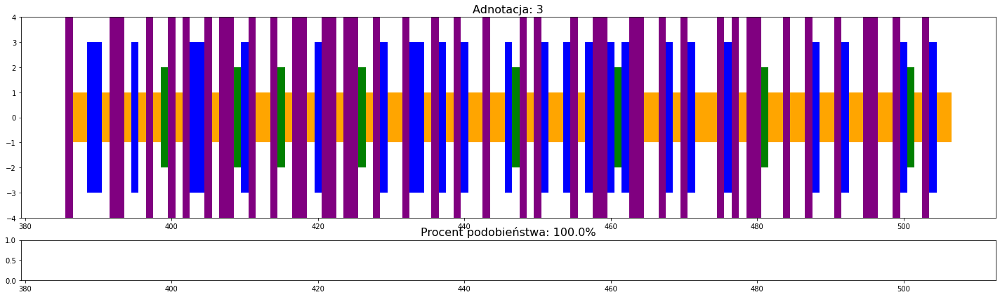

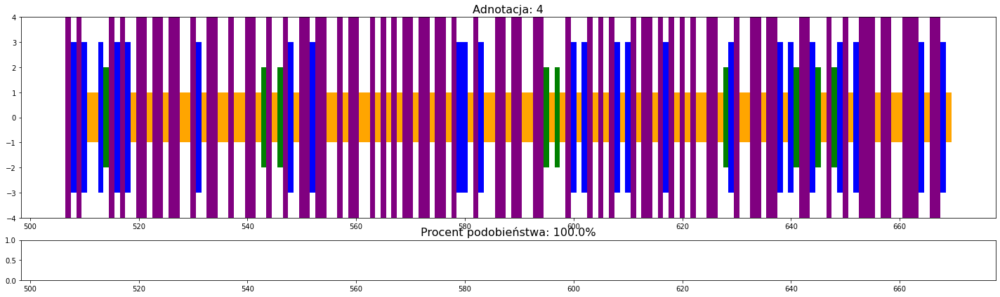

...

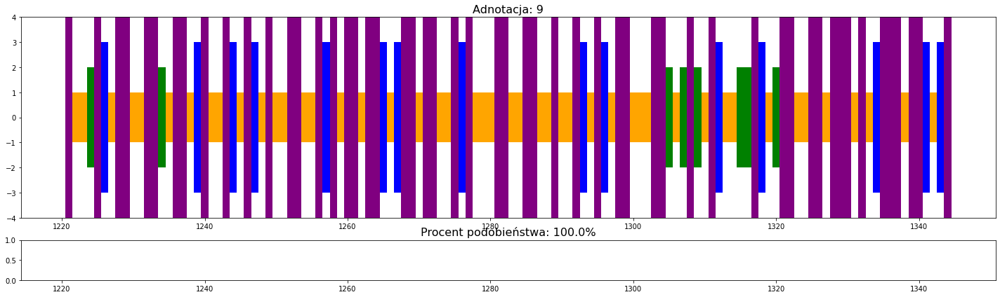

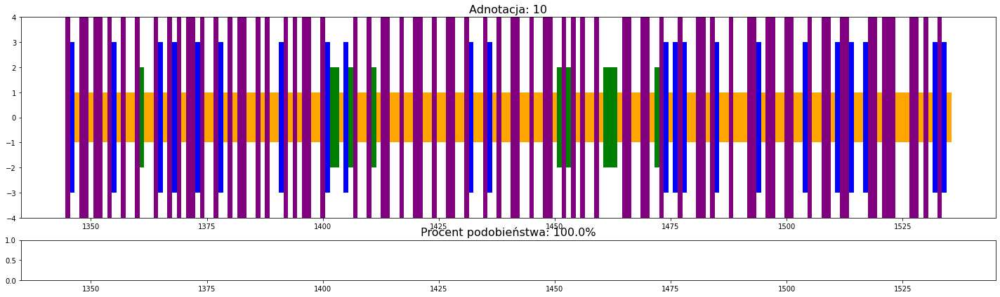

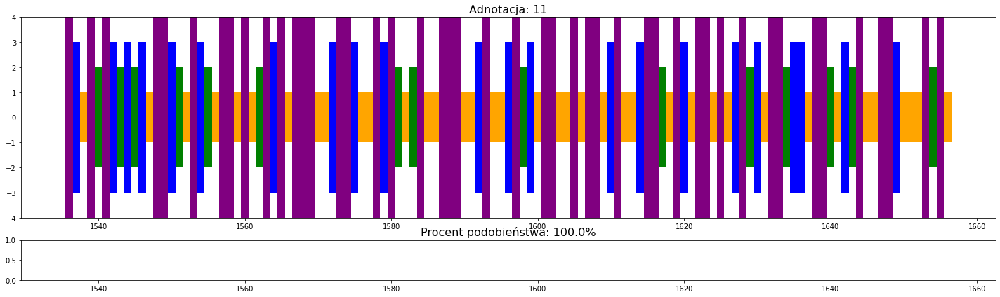

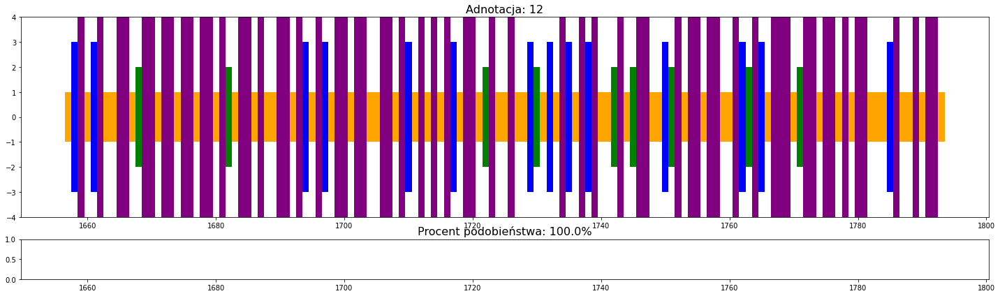

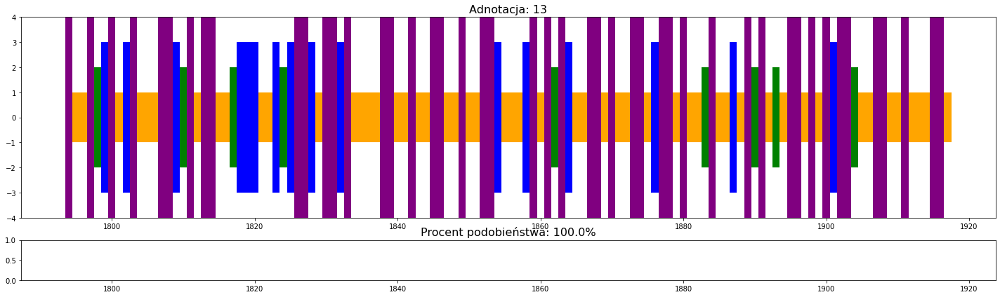

In [430]:
for annotation in df_kmeans.annotation.unique():
    compare_labels(df_kmeans[df_kmeans['annotation']==annotation], df_kmeans[df_kmeans['annotation']==annotation])

# ZIP F ANALYSYS

In [67]:
# microstates_kmeans
# microstates_cos
# microstates_kmean_cos
# microstates_cos_pca
# microstates_kmean_cos_pca

In [134]:
#Importing the libraries
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
#Importing the String module
from nltk.book import *
from nltk.probability import FreqDist, ConditionalFreqDist
import nltk
from nltk.corpus import gutenberg
import string
from nltk.corpus import stopwords
import category_encoders as ce

plt.rcParams['figure.figsize'] = [20, 8]

In [72]:
import re 
from nltk.corpus.util import LazyCorpusLoader 
from nltk.corpus.reader import EuroparlCorpusReader
 
# Create a new corpus reader instance for each European language 
danish = LazyCorpusLoader( 
    'europarl_raw/danish', EuroparlCorpusReader, r'ep-.*\.da', encoding='utf-8') 
 
dutch = LazyCorpusLoader( 
    'europarl_raw/dutch', EuroparlCorpusReader, r'ep-.*\.nl', encoding='utf-8') 
 
english = LazyCorpusLoader( 
    'europarl_raw/english', EuroparlCorpusReader, r'ep-.*\.en', encoding='utf-8') 
 
finnish = LazyCorpusLoader( 
    'europarl_raw/finnish', EuroparlCorpusReader, r'ep-.*\.fi', encoding='utf-8') 
 
french = LazyCorpusLoader( 
    'europarl_raw/french', EuroparlCorpusReader, r'ep-.*\.fr', encoding='utf-8') 
 
german = LazyCorpusLoader( 
    'europarl_raw/german', EuroparlCorpusReader, r'ep-.*\.de', encoding='utf-8') 
 
greek = LazyCorpusLoader( 
    'europarl_raw/greek', EuroparlCorpusReader, r'ep-.*\.el', encoding='utf-8') 
 
italian = LazyCorpusLoader( 
    'europarl_raw/italian', EuroparlCorpusReader, r'ep-.*\.it', encoding='utf-8') 
 
portuguese = LazyCorpusLoader( 
    'europarl_raw/portuguese', EuroparlCorpusReader, r'ep-.*\.pt', encoding='utf-8') 
 
spanish = LazyCorpusLoader( 
    'europarl_raw/spanish', EuroparlCorpusReader, r'ep-.*\.es', encoding='utf-8') 
 
swedish = LazyCorpusLoader( 
    'europarl_raw/swedish', EuroparlCorpusReader, r'ep-.*\.sv', encoding='utf-8') 

In [75]:
new_figure=False
log=True
freq_rank=True
list_punctuation = list(string.punctuation)

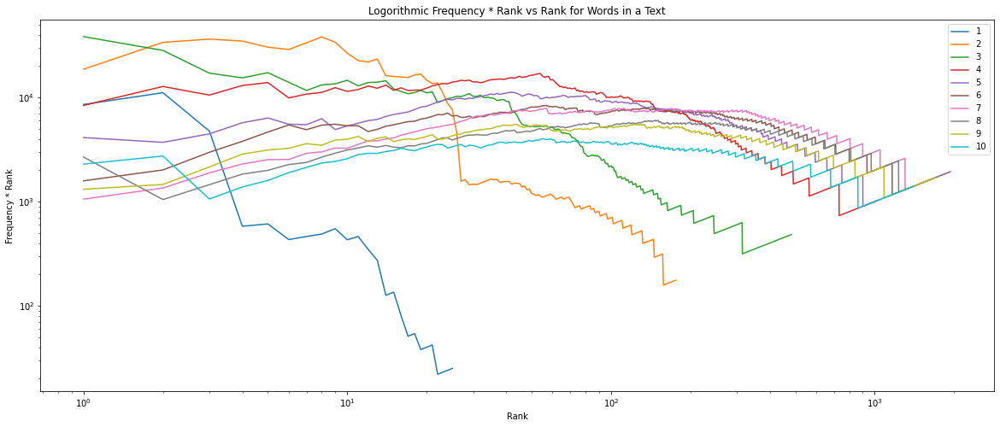

In [155]:
token_n = [word.lower() for word in english.words() if word.isalnum()]
cfdist = ConditionalFreqDist((len(word), word) for word in token_n)
[cfdist[1].pop(punctuation, '') for punctuation in list_punctuation]
for i in sorted(cfdist.keys())[:10]:
    zipf(cfdist[i], label=i)


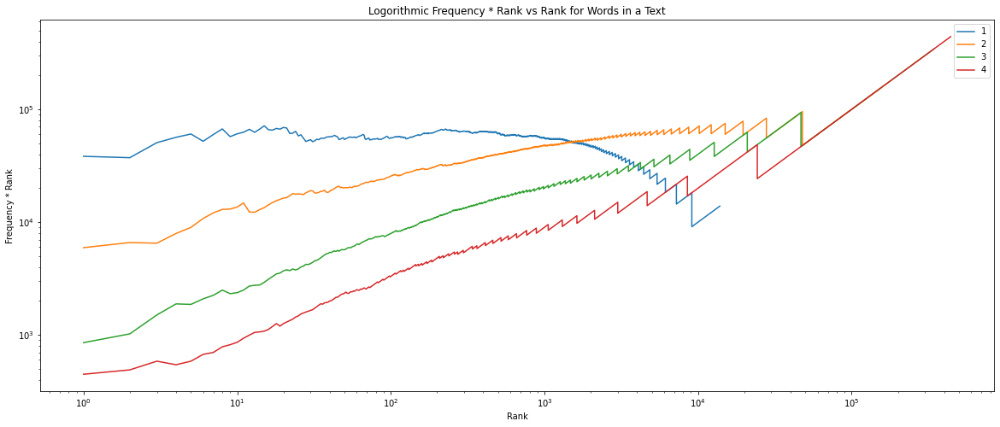

In [156]:
token_n = [word.lower() for word in english.words() if word.isalnum()]
n_grams = {}
for i in range(1, 5):
    n_gram = nltk.ngrams(token_n, i)
    n_grams[i] = nltk.FreqDist(n_gram)
for n_gram, fdist in n_grams.items():
    zipf(fdist, label=n_gram)

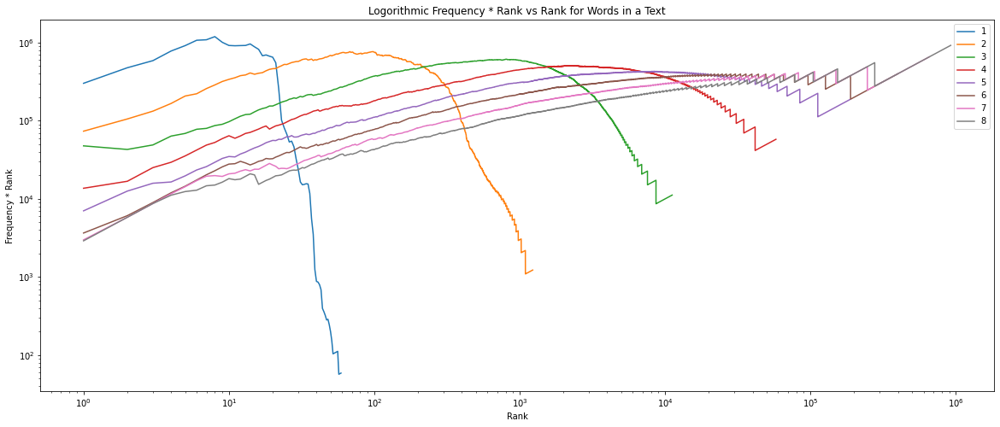

In [252]:
token_n = [word.lower() for word in english.words() if word.isalnum()]
letters = [char for word in token_n for char in word]
n_grams = {}

for i in range(1, 9):
    n_gram = nltk.ngrams(letters, i)
    n_grams[i] = nltk.FreqDist(n_gram)

for n_gram, fdist in n_grams.items():
    zipf(fdist, label=n_gram)

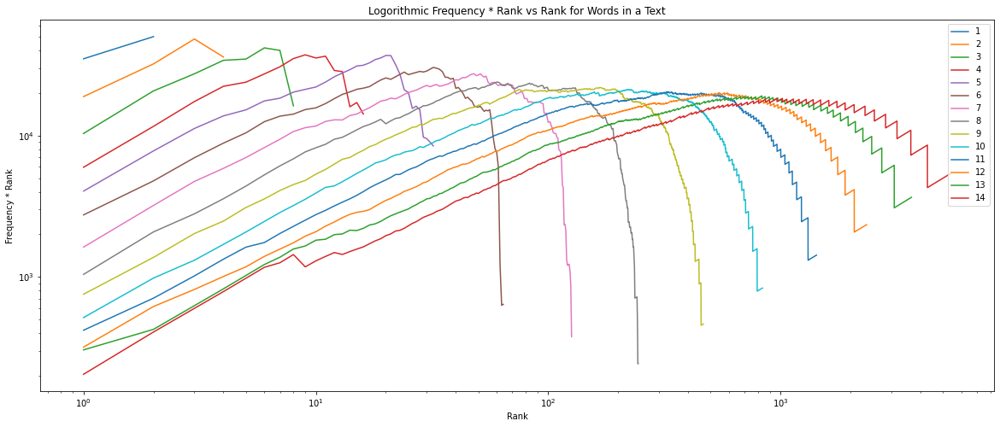

In [253]:
encoded_letters = encode_letters(letters[:10000])
n_grams = {}

for i in range(1, 15):
    n_gram = nltk.ngrams(encoded_letters, i)
    n_grams[i] = nltk.FreqDist(n_gram)

for n_gram, fdist in n_grams.items():
    zipf(fdist, label=n_gram)

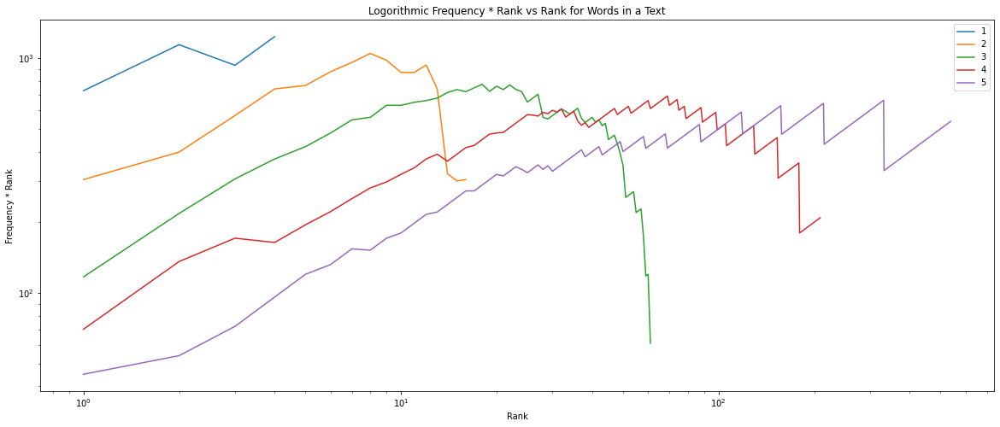

In [254]:
microstates_string = df_cos['label'].values
n_grams = {}

for i in range(1, 6):
    n_gram = nltk.ngrams(microstates_string, i)
    n_grams[i] = nltk.FreqDist(n_gram)

for n_gram, fdist in n_grams.items():
    zipf(fdist, label=n_gram)

In [431]:
microstates_kmeans_ngrams = prepare_microstates_ngrams(df_kmeans['label'].values)

In [432]:
microstates_cos_ngrams = prepare_microstates_ngrams(df_cos['label'].values)

In [433]:
english_ngrams = prepare_language_ngrams(english)
german_ngrams = prepare_language_ngrams(german)
italian_ngrams = prepare_language_ngrams(italian)
swedish_ngrams = prepare_language_ngrams(swedish)

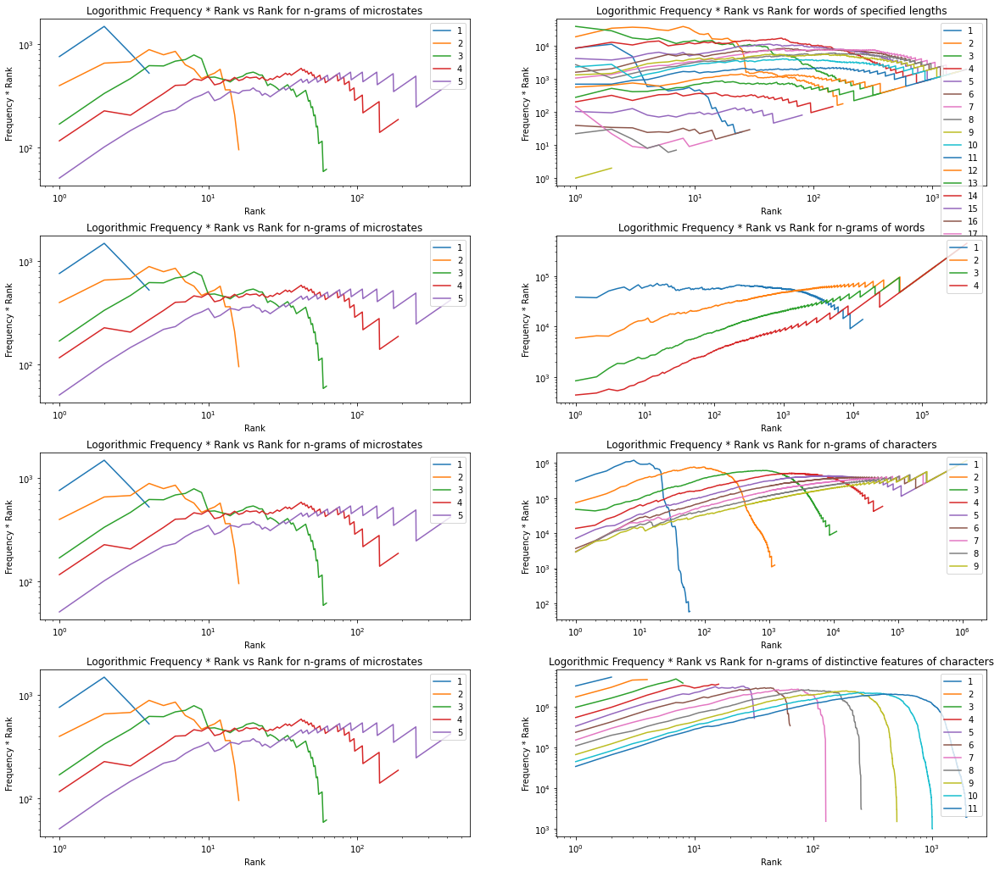

In [434]:
plot_microstates_to_language(microstates_kmeans_ngrams, english_ngrams)

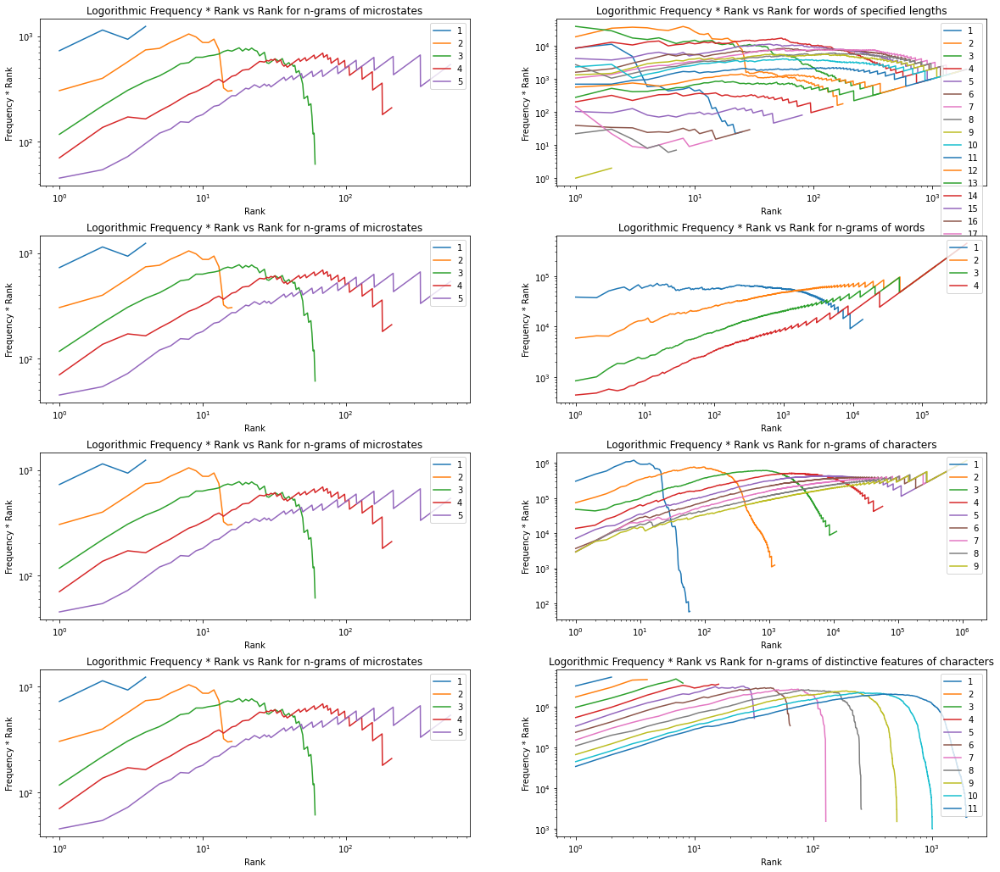

In [435]:
plot_microstates_to_language(microstates_cos_ngrams, english_ngrams)

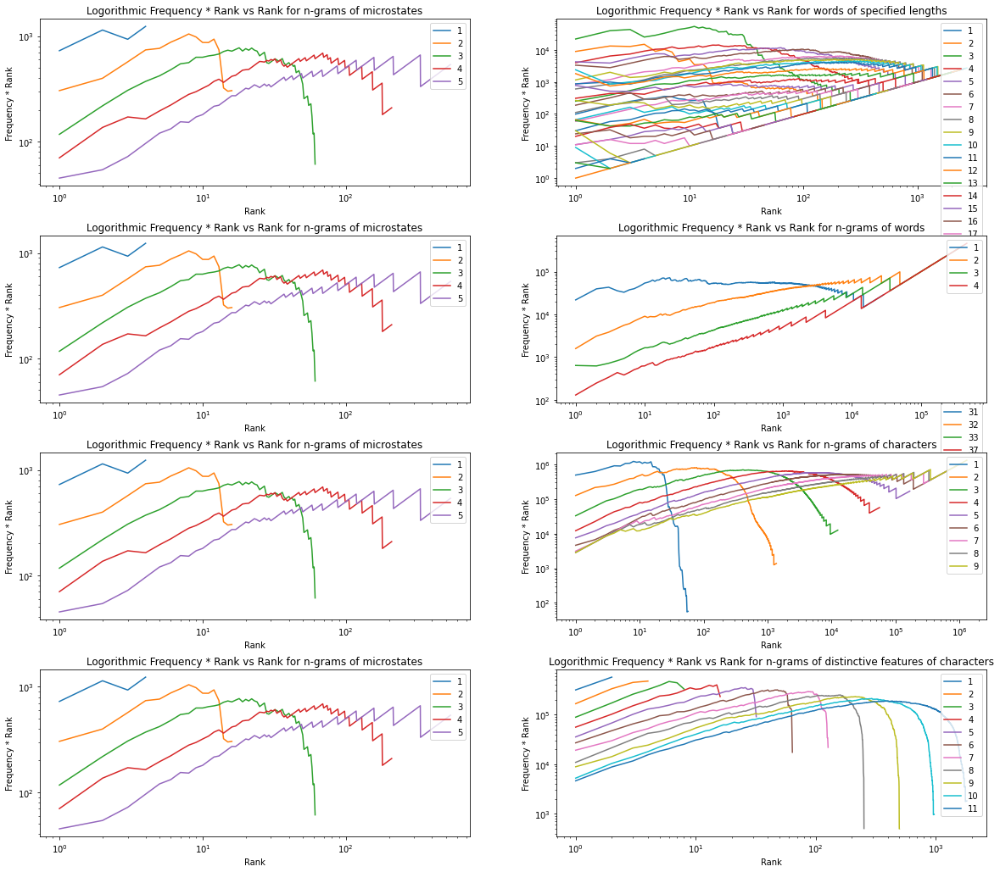

In [347]:
plot_microstates_to_language(microstates_ngrams, german_ngrams)

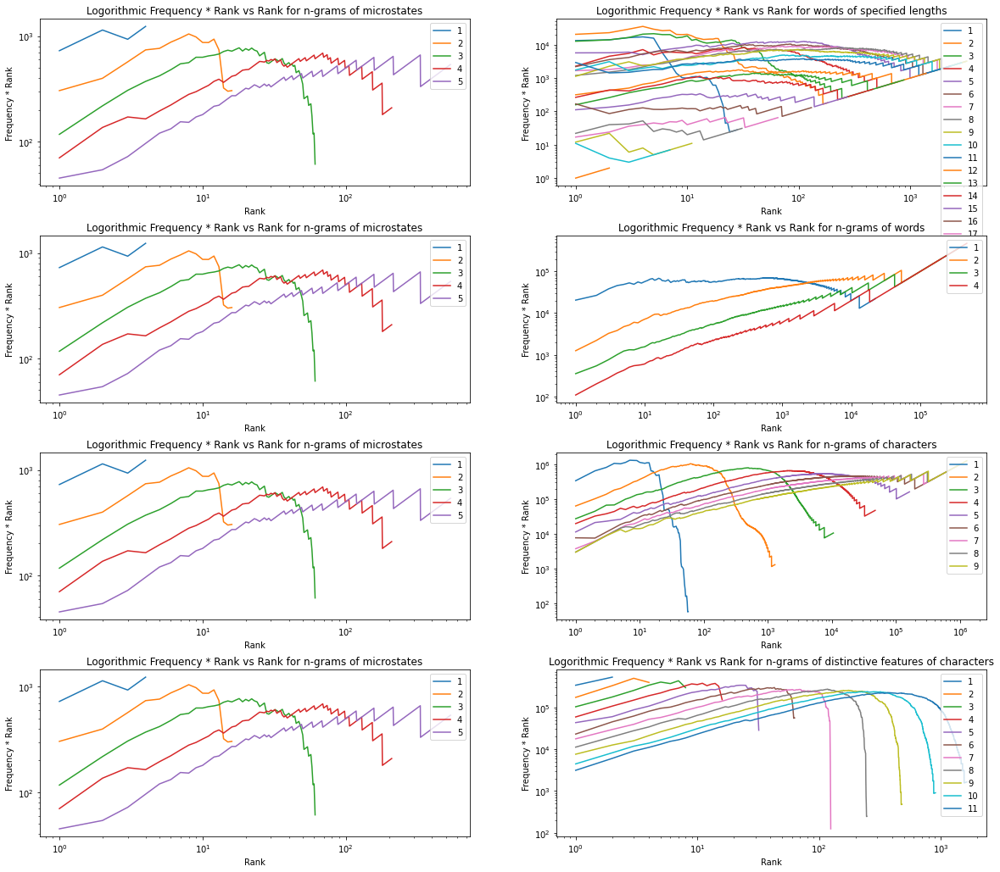

In [348]:
plot_microstates_to_language(microstates_ngrams, italian_ngrams)

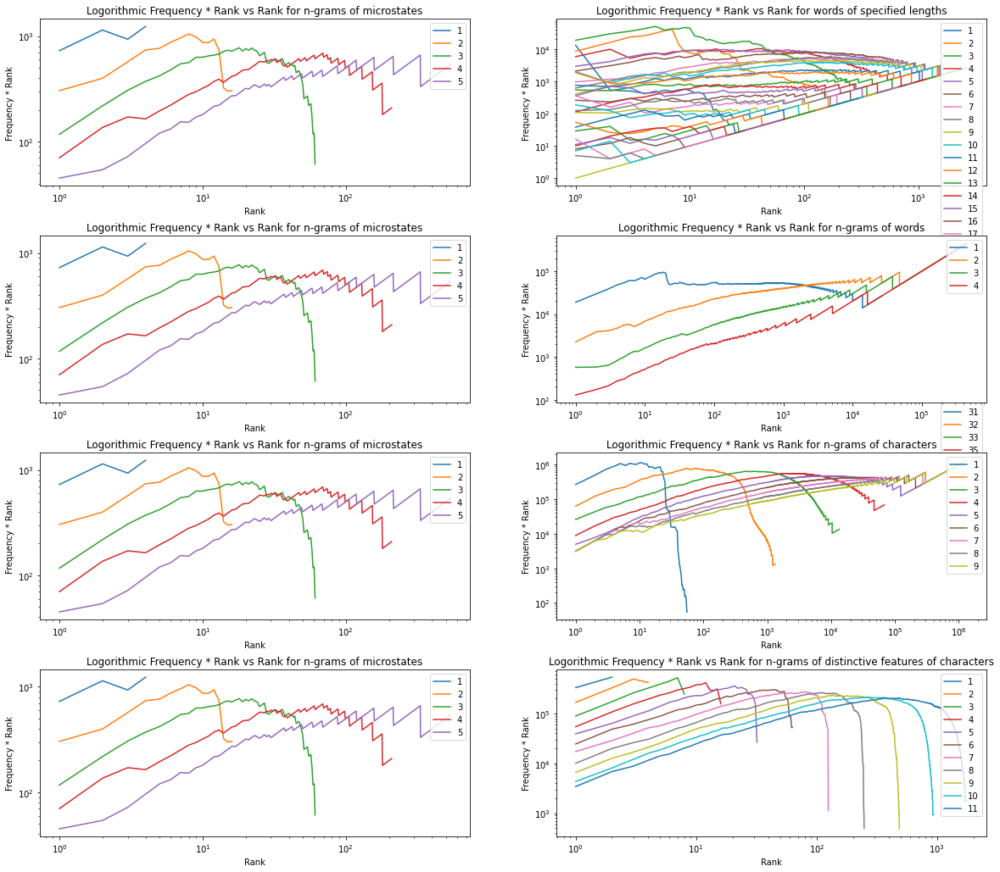

In [349]:
plot_microstates_to_language(microstates_ngrams, swedish_ngrams)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


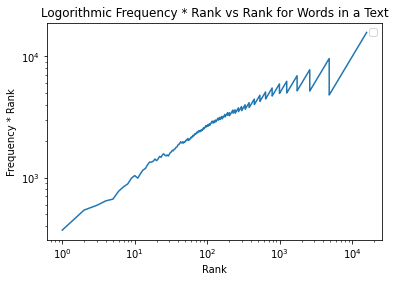

In [78]:
tokens = nltk.word_tokenize(nltk.corpus.genesis.raw('english-web.txt'))
token_n = [word for word in tokens if word.isalnum()]
bigrams = nltk.bigrams(token_n)
frequency = nltk.FreqDist(bigrams)
zipf(frequency)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


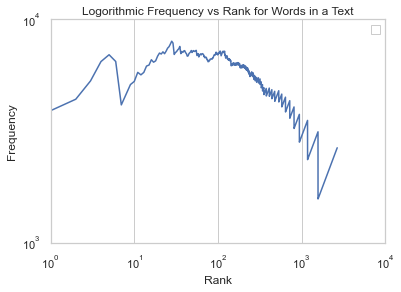

In [470]:
zipf(nltk.corpus.genesis.words('english-web.txt'))

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


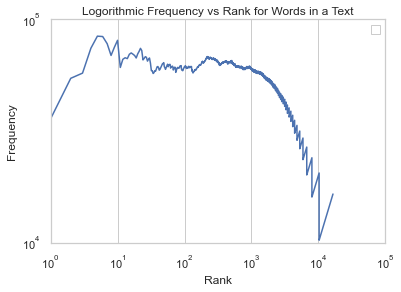

In [471]:
zipf(english.words())

## DRAFT

In [ ]:
import re
  
frequency = {}
 
with open('dracula.txt', 'r') as content:
    text_string = content.read()
 
    words = re.findall(r'\b[A-Za-z][a-z]{2,9}\b', text_string)
         
    for word in words:
        count = frequency.get(word,0)
        frequency[word] = count + 1
 
    most_frequent = dict(sorted(frequency.items(), key=lambda elem: elem[1], reverse=True))
 
    top_count = 0
         
    for idx, (words, frequency) in enumerate(most_frequent.items()):
        if idx == 0:
            top_count = frequency
        print(words, frequency, round(top_count/frequency, 2))

"""
the 7473 1.0
and 5796 1.29
that 2434 3.07
was 1869 4.0
for 1480 5.05
not 1399 5.34
his 1384 5.4
with 1281 5.83
you 1267 5.9
all 1118 6.68
"""

In [ ]:
czech_corpus = nltk.corpus.udhr.words('Czech-Latin2')
german_corpus = nltk.corpus.udhr.words('German_Deutsch-Latin1')
english_corpus = nltk.corpus.udhr.words('English-Latin1')
italian_corpus = nltk.corpus.udhr.words('Italian-Latin1')
norwegian_corpus = nltk.corpus.udhr.words('Norwegian-Latin1')
polish_corpus = nltk.corpus.udhr.words('Polish-Latin2')

In [ ]:
for lang in nltk.corpus.genesis.fileids():
    print(f"{lang}: {len(nltk.corpus.genesis.raw(lang))}")

english-kjv.txt: 195515
english-web.txt: 188666
finnish.txt: 193323
french.txt: 191426
german.txt: 202219
lolcat.txt: 71209
portuguese.txt: 185172
swedish.txt: 192894


In [46]:
"""

epoka -> 1/4 sekudny -> 60 odczytów

1) Clustering with GFP peaks
    -> 4 klastry
    -> kanał epoka
    -> PCA
    -> 4x250k - znajdujemy indeksy - indeksy uśrednione na kanałach - następnie dopasowujemy dla kadej epoki najblisze uśrednienie

2) Podobieństwo obrazów
    -> uśrednienie w obrębie epoki
    -> stworzenie macierzy bazując na koordynatach elektrod
    -> klasteryzacja bazując na podobieństwie obrazów

3) GFP peaks labels for CNN
    -> wyznaczenie oznaczeń bazując na powyzszych metodach
    -> uśrednienie w obrębie epoki
    -> stworzenie macierzy bazując na koordynatach elektrod
    -> nauczenie sieci CNN bazując na oznaczeniach
    -> odczytanie ostatnich warstw sieci


"""

'\n\nepoka -> 1/4 sekudny -> 60 odczytów\n\n1) Clustering with GFP peaks\n    -> 4 klastry\n    -> kanał epoka\n    -> PCA\n    -> 4x250k - znajdujemy indeksy - indeksy uśrednione na kanałach - następnie dopasowujemy dla kadej epoki najblisze uśrednienie\n\n2) Podobieństwo obrazów\n    -> uśrednienie w obrębie epoki\n    -> stworzenie macierzy bazując na koordynatach elektrod\n    -> klasteryzacja bazując na podobieństwie obrazów\n\n3) GFP peaks labels for CNN\n    -> wyznaczenie oznaczeń bazując na powyzszych metodach\n    -> uśrednienie w obrębie epoki\n    -> stworzenie macierzy bazując na koordynatach elektrod\n    -> nauczenie sieci CNN bazując na oznaczeniach\n    -> odczytanie ostatnich warstw sieci\n\n\n'

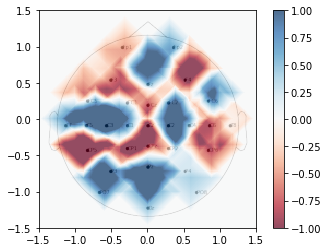

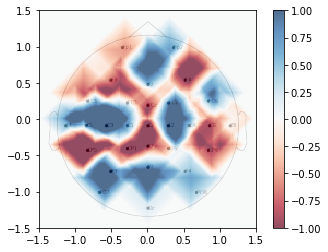

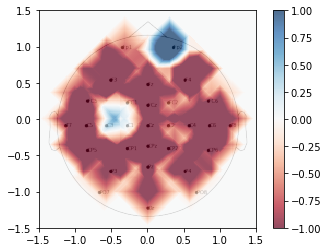

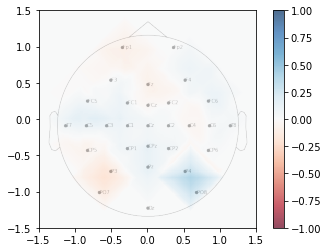

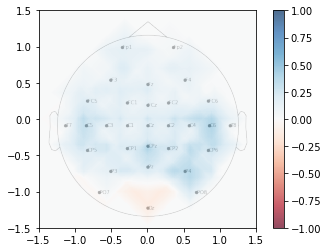

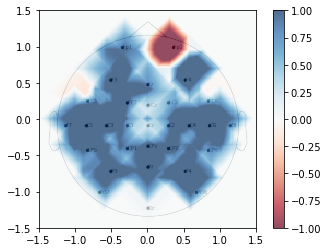

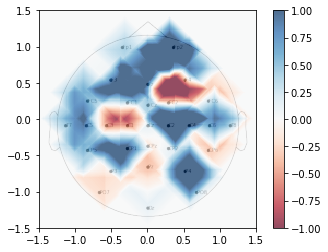

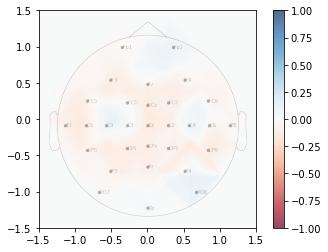

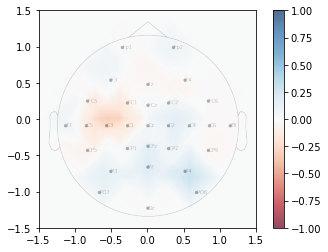

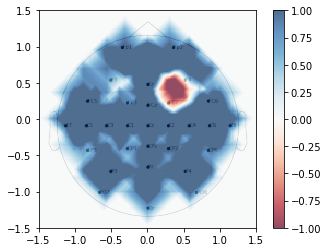

In [45]:
for time_iteration in np.arange(0,4000,400):
    head_copy = raw.plot_sensors(show_names=True, ch_type='eeg', sphere=(0,0,0,1.1), show=False, verbose=0)
    plt.close()
    mesh = create_moment_topography(config=config, moment_signal=raw.grouped_mean_df.iloc[time_iteration], df_coordinates=df_coordinates)
    plot_topography(config=config, mesh=mesh, head_figure=head_copy)

In [43]:
mesh_0 = create_moment_topography(config=config, moment_signal=raw.to_data_frame().iloc[0], df_coordinates=df_coordinates)

In [191]:
mesh_1 = create_moment_topography(config=config, moment_signal=raw_df.iloc[50000], df_coordinates=df_coordinates)

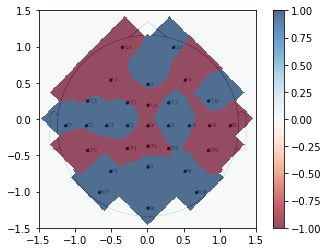

In [44]:
head_copy = raw.plot_sensors(show_names=True, ch_type='eeg', sphere=(0,0,0,1.1), show=False, verbose=0)
plt.close()
plot_topography(config=config, mesh=mesh_0, head_figure=head_copy)

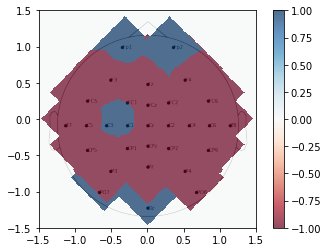

In [1379]:
head_copy = raw.plot_sensors(show_names=True, ch_type='eeg', sphere=(0,0,0,1.1), show=False, verbose=0)
plt.close()
plot_topography(config=config, mesh=mesh_1, head_figure=head_copy)

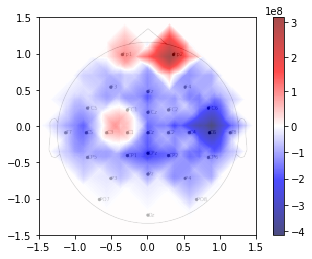

In [193]:
head_copy = raw.plot_sensors(show_names=True, ch_type='eeg', sphere=(0,0,0,1.1), show=False, verbose=0)
plt.close()
plot_topography(config=config, mesh=mesh_1, head_figure=head_copy)

In [43]:
print(f'Lenght: {raw.__len__()}')
print(f'Shape: {raw._data.shape}')

Lenght: 246352
Shape: (30, 246352)


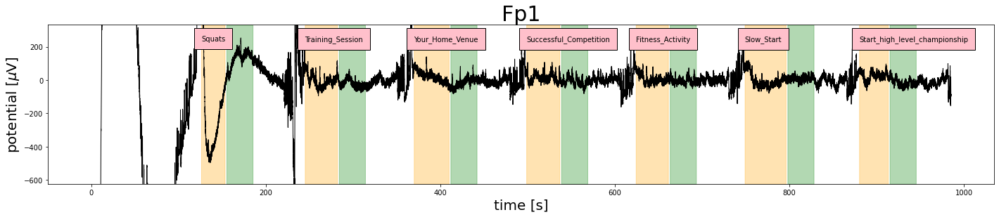

In [910]:
plot_channel(raw, annotations=raw._annotations, channel='Fp1')

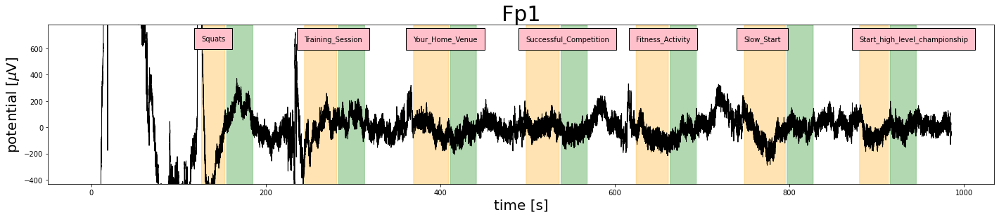

In [245]:
plot_channel(raw, 'Fp1')

/Users/romankarski/Documents/Documents_v2/Projects/EEG/thesis/src/utils/utils.py:226: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(20,4))


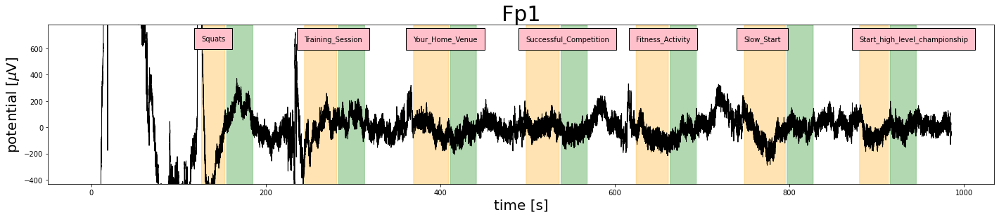

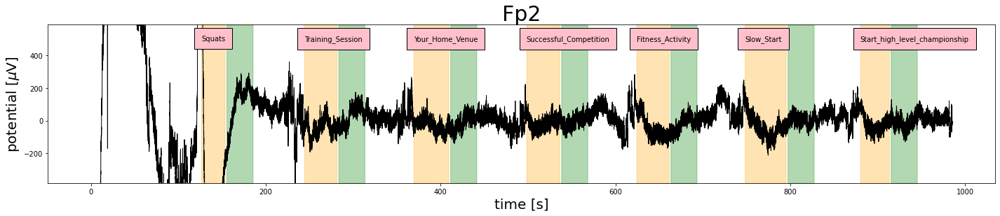

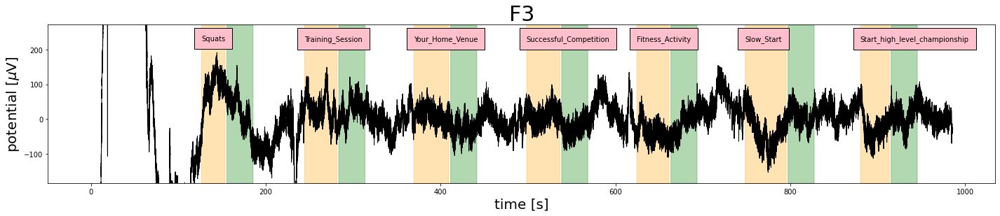

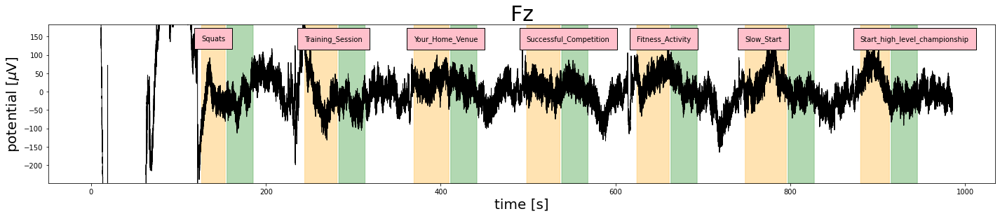

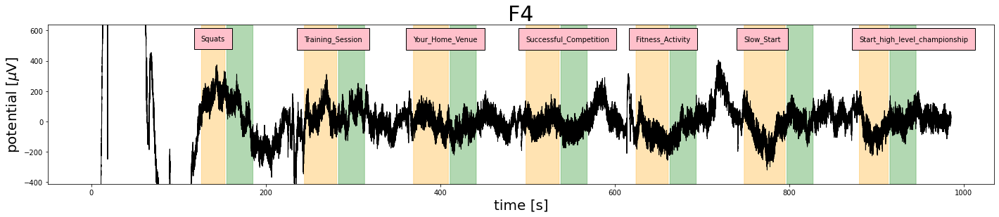

...

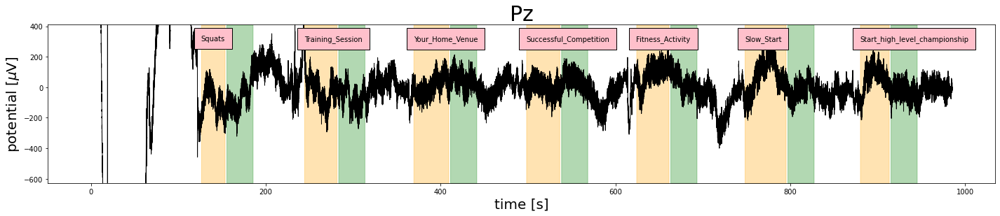

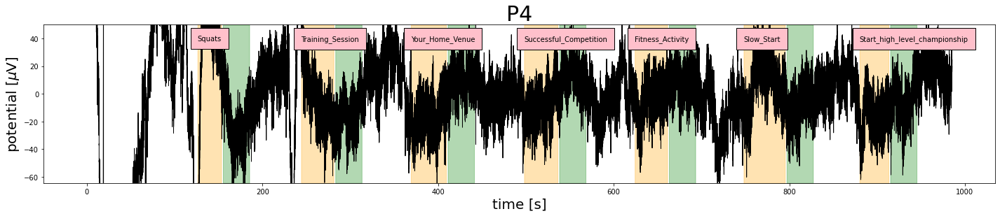

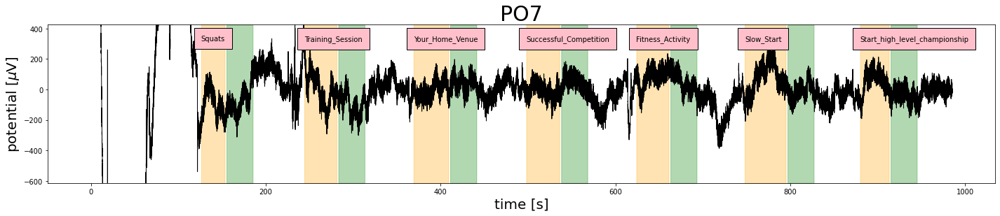

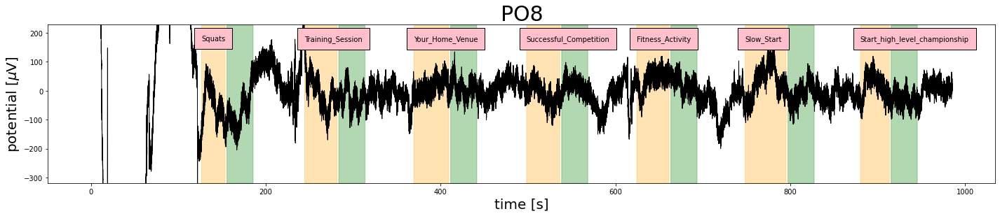

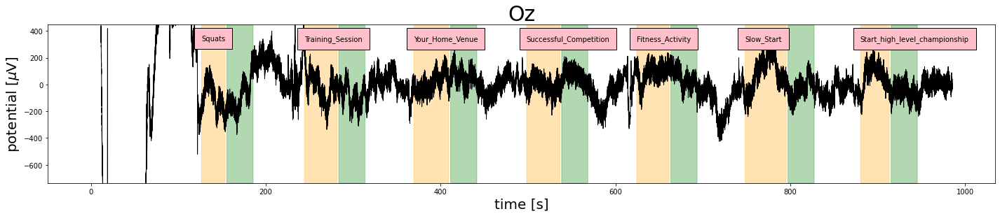

In [292]:
for channel in raw.ch_names:
    plot_channel(raw, channel)

In [306]:
raw.to_data_frame()

,time,Fp1,Fp2,F3,Fz,F4,FC5,FC1,FCz,FC2,...,CP1,CPz,CP2,CP6,P3,Pz,P4,PO7,PO8,Oz
0,0,-4.489098e+09,-2.923566e+09,-2.435600e+09,2.167676e+09,-5.441495e+09,-1.546009e+09,-1.950481e+09,1.404023e+08,-1.400436e+09,...,-6.473612e+08,-1.529069e+09,1.398185e+09,-4.226689e+09,2.871079e+09,5.511446e+09,3.138902e+08,5.287439e+09,2.734864e+09,6.337437e+09
1,4,-9.853867e+09,-6.413439e+09,-5.347438e+09,4.760131e+09,-1.194639e+10,-3.397087e+09,-4.284187e+09,3.081816e+08,-3.075431e+09,...,-1.421733e+09,-3.357846e+09,3.070432e+09,-9.282498e+09,6.304564e+09,1.210294e+10,6.879222e+08,1.161026e+10,6.006734e+09,1.391718e+10
2,8,-8.473820e+09,-5.506635e+09,-4.598668e+09,4.100265e+09,-1.027539e+10,-2.937915e+09,-3.689706e+09,2.669921e+08,-2.644836e+09,...,-1.220964e+09,-2.889116e+09,2.647282e+09,-7.990837e+09,5.426928e+09,1.042174e+10,5.901699e+08,9.992126e+09,5.172819e+09,1.198153e+10
3,12,-9.187144e+09,-5.966686e+09,-4.986438e+09,4.455067e+09,-1.114687e+10,-3.202886e+09,-4.005567e+09,2.921984e+08,-2.867164e+09,...,-1.321531e+09,-3.135522e+09,2.878499e+09,-8.671495e+09,5.889420e+09,1.131790e+10,6.410719e+08,1.084220e+10,5.619577e+09,1.300673e+10
4,16,-1.059358e+10,-6.881991e+09,-5.757078e+09,5.144867e+09,-1.287419e+10,-3.684682e+09,-4.624417e+09,3.365533e+08,-3.312768e+09,...,-1.532101e+09,-3.626338e+09,3.316396e+09,-1.002002e+10,6.799197e+09,1.306704e+10,7.374521e+08,1.251882e+10,6.488135e+09,1.501915e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246347,985388,-5.212805e+07,-1.765934e+07,-3.708177e+07,-3.723223e+07,2.389715e+07,-3.401667e+07,-1.513441e+07,-7.655093e+05,4.044361e+07,...,1.183733e+07,6.206534e+06,3.031529e+07,4.867521e+07,2.143901e+06,1.507542e+06,2.477417e+07,-2.847744e+06,2.284625e+07,-3.737140e+06
246348,985392,-4.906258e+07,-1.571473e+07,-3.504254e+07,-3.688016e+07,2.278357e+07,-3.117995e+07,-1.300684e+07,-1.059694e+06,4.099908e+07,...,1.279279e+07,8.384137e+06,2.898604e+07,4.771067e+07,1.898404e+06,-9.188237e+05,2.304084e+07,-5.207891e+06,2.124662e+07,-7.636682e+06
246349,985396,-4.942595e+07,-1.613324e+07,-3.367900e+07,-3.478257e+07,1.996000e+07,-3.030483e+07,-1.252095e+07,-8.364033e+05,4.099241e+07,...,1.270835e+07,9.060461e+06,2.891261e+07,4.352708e+07,3.072457e+06,1.064311e+06,2.263350e+07,-4.540624e+06,2.075216e+07,-6.780808e+06
246350,985400,-4.769178e+07,-1.408918e+07,-3.091247e+07,-3.409921e+07,2.542059e+07,-2.938527e+07,-1.046247e+07,1.027552e+05,4.362978e+07,...,1.501717e+07,1.144559e+07,2.822054e+07,4.260886e+07,1.917819e+06,-1.481311e+06,2.170366e+07,-6.805059e+06,1.867285e+07,-9.802219e+06


## Data

In [6]:
os.listdir("../data")

['data28_marker.mat', 'data28_eeg.mat']

In [10]:
dir_path = "../data/"

In [11]:
os.listdir(dir_path)[0]

'data28_marker.mat'

In [14]:
df_data_0 = sio.loadmat(dir_path+os.listdir(dir_path)[0])

In [15]:
df_data_0

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Wed Mar 28 16:05:21 2018',
 '__version__': '1.0',
 '__globals__': [],
 'marker': array([[ 31521],
        [156040],
        [187240],
        [ 92449],
        [220018],
        [ 61225],
        [124673]], dtype=int32)}

In [16]:
df_data_1 = sio.loadmat(dir_path+os.listdir(dir_path)[1])

In [17]:
df_data_1

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Wed Mar 28 16:05:18 2018',
 '__version__': '1.0',
 '__globals__': [],
 'eeg': array([[-7.52631348e+03, -1.65120195e+04, -1.41939502e+04, ...,
         -9.38215408e+01, -9.38963394e+01, -9.23519211e+01],
        [-5.91809570e+03, -1.29800186e+04, -1.11501533e+04, ...,
         -5.60982056e+01, -5.46018066e+01, -5.45133209e+01],
        [-5.41325732e+03, -1.18777354e+04, -1.02118906e+04, ...,
         -7.21187286e+01, -6.96254044e+01, -6.81329651e+01],
        ...,
        [ 2.53456348e+03,  5.56298145e+03,  4.78246387e+03, ...,
         -2.17407532e+01, -1.97104149e+01, -2.07813282e+01],
        [-9.37054062e+01, -2.03005814e+02, -1.72709244e+02, ...,
         -4.10494995e+00, -3.92809200e+00, -4.02605295e+00],
        [ 3.62679541e+03,  7.96078809e+03,  6.84770947e+03, ...,
         -2.03331432e+01, -1.85414085e+01, -1.90624657e+01]])}

In [22]:
eeg_28 = df_data_1['eeg']

In [46]:
eeg_28.shape

(30, 246352)

| Zadanie |	Nr osoby  |Kolejnosc|
|---------|------|-------|
| Squats.wav |	P28	 |1 |
| Training_Session.wav |	P28	|2|
| Your_Home_Venue.wav |	P28 |	3|
| Successful_Competition.wav |	P28 |	4|
| Fitness_Activity.wav | P28 |	5|
| Slow_Start.wav |	P28 |	6|
| Start_high_level_championship.wav |	P28 |	7|

In [24]:
eeg_28[0]

array([ -7526.31347656, -16512.01953125, -14193.95019531, ...,
          -93.82154083,    -93.89633942,    -92.35192108])

In [35]:
np.quantile(eeg_28[0], q=np.arange(0,1.01,0.1))

array([-1.78106836e+04, -1.17094511e+02, -3.95562088e+01, -2.42915937e+01,
       -1.36164034e+01, -3.98527026e+00,  5.62420883e+00,  1.75458210e+01,
        3.73692856e+01,  9.95023018e+01,  4.70912402e+03])

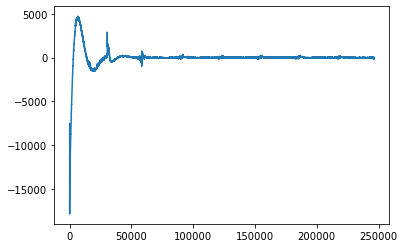

In [44]:
plt.plot(eeg_28[0][:])

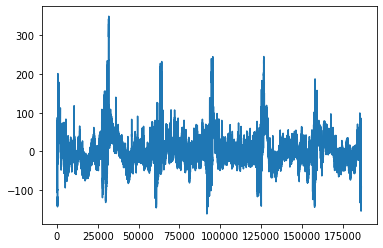

In [43]:
plt.plot(eeg_28[0][60000:])

## MNE functions

In [ ]:
raw = simulated_raw[28]

Used Annotations descriptions: ['Fitness_Activity_auditory', 'Fitness_Activity_imagine', 'Slow_Start_auditory', 'Slow_Start_imagine', 'Squats_auditory', 'Squats_imagine', 'Start_high_level_championship_auditory', 'Start_high_level_championship_imagine', 'Successful_Competition_auditory', 'Successful_Competition_imagine', 'Training_Session_auditory', 'Training_Session_imagine', 'Your_Home_Venue_auditory', 'Your_Home_Venue_imagine']
Projections have already been applied. Setting proj attribute to True.


/var/folders/2d/_448g6ld0330c03f38wpcyvm0000gn/T/ipykernel_8525/1121013959.py:2: RuntimeWarning: An average reference projection was already added. The data has been left untouched.
  raw.set_eeg_reference(projection=True).apply_proj()


Fitted sphere radius:         93.7 mm
Origin head coordinates:      -0.8 14.4 46.4 mm
Origin device coordinates:    -0.8 14.4 46.4 mm
Not setting metadata
2 matching events found
Setting baseline interval to [-0.2, 0.0] sec
Applying baseline correction (mode: mean)
Created an SSP operator (subspace dimension = 1)
1 projection items activated
Using data from preloaded Raw for 2 events and 176 original time points ...
0 bad epochs dropped
Fitted sphere radius:         93.7 mm
Origin head coordinates:      -0.8 14.4 46.4 mm
Origin device coordinates:    -0.8 14.4 46.4 mm
Projections have already been applied. Setting proj attribute to True.
Projections have already been applied. Setting proj attribute to True.


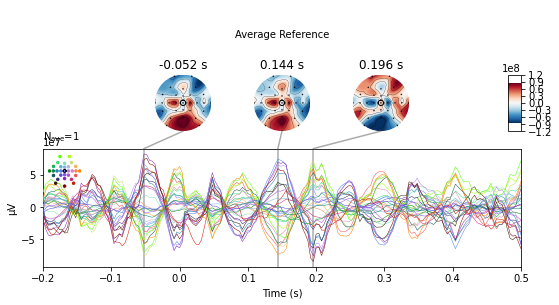

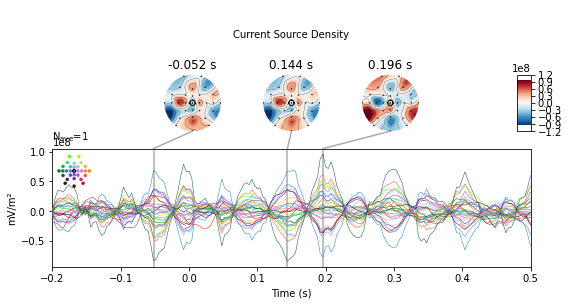

Fitted sphere radius:         93.7 mm
Origin head coordinates:      -0.8 14.4 46.4 mm
Origin device coordinates:    -0.8 14.4 46.4 mm
Fitted sphere radius:         93.7 mm
Origin head coordinates:      -0.8 14.4 46.4 mm
Origin device coordinates:    -0.8 14.4 46.4 mm
Fitted sphere radius:         93.7 mm
Origin head coordinates:      -0.8 14.4 46.4 mm
Origin device coordinates:    -0.8 14.4 46.4 mm
Fitted sphere radius:         93.7 mm
Origin head coordinates:      -0.8 14.4 46.4 mm
Origin device coordinates:    -0.8 14.4 46.4 mm
Fitted sphere radius:         93.7 mm
Origin head coordinates:      -0.8 14.4 46.4 mm
Origin device coordinates:    -0.8 14.4 46.4 mm
Fitted sphere radius:         93.7 mm
Origin head coordinates:      -0.8 14.4 46.4 mm
Origin device coordinates:    -0.8 14.4 46.4 mm
Fitted sphere radius:         93.7 mm
Origin head coordinates:      -0.8 14.4 46.4 mm
Origin device coordinates:    -0.8 14.4 46.4 mm
Fitted sphere radius:         93.7 mm
Origin head coordinates:

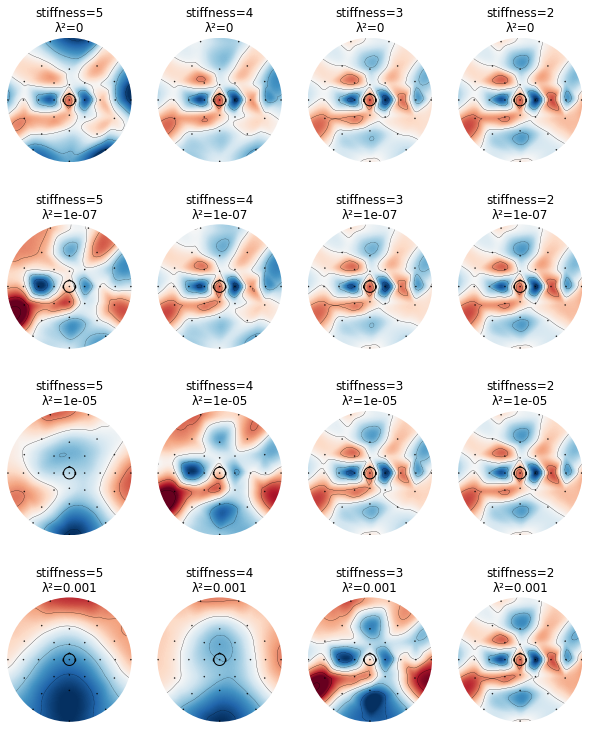

In [ ]:
events, events_id = mne.events_from_annotations(raw)
raw.set_eeg_reference(projection=True).apply_proj()
raw_csd = mne.preprocessing.compute_current_source_density(raw)
renamed_tasks_dict = {}
for task in list(events_id.keys()):
    renamed_tasks_dict.update({task.split('_')[-1]:events_id[task]})
epochs = mne.Epochs(raw, events, event_id=renamed_tasks_dict, tmin=-0.2, tmax=.5,
                    preload=True)
evoked = epochs['auditory'].average()
evoked_csd = mne.preprocessing.compute_current_source_density(evoked)
# evoked.plot_joint(title='Average Reference', show=False)
# evoked_csd.plot_joint(title='Current Source Density')
# fig, ax = plt.subplots(4, 4)
# fig.subplots_adjust(hspace=0.5)
# fig.set_size_inches(10, 10)
# for i, lambda2 in enumerate([0, 1e-7, 1e-5, 1e-3]):
#     for j, m in enumerate([5, 4, 3, 2]):
#         this_evoked_csd = mne.preprocessing.compute_current_source_density(
#             evoked, stiffness=m, lambda2=lambda2)
#         this_evoked_csd.plot_topomap(
#             0.1, axes=ax[i, j], outlines='skirt', contours=4, time_unit='s',
#             colorbar=False, show=False)
#         ax[i, j].set_title('stiffness=%i\nλ²=%s' % (m, lambda2))

Fitting ICA to data using 30 channels (please be patient, this may take a while)
    Applying projection operator with 1 vector (pre-whitener computation)
    Applying projection operator with 1 vector (pre-whitener application)


/var/folders/2d/_448g6ld0330c03f38wpcyvm0000gn/T/ipykernel_8525/1702439165.py:2: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 20 components
    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 12.1s.
    Applying projection operator with 1 vector (pre-whitener application)
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
492 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
492 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped


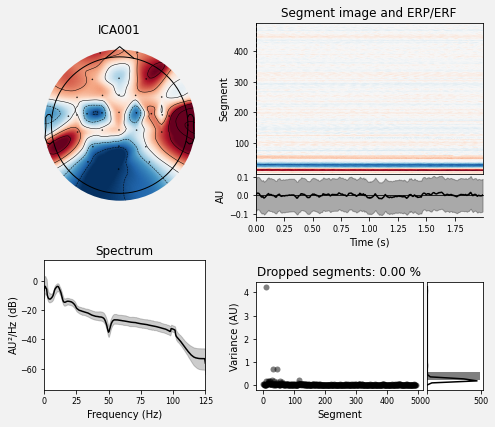

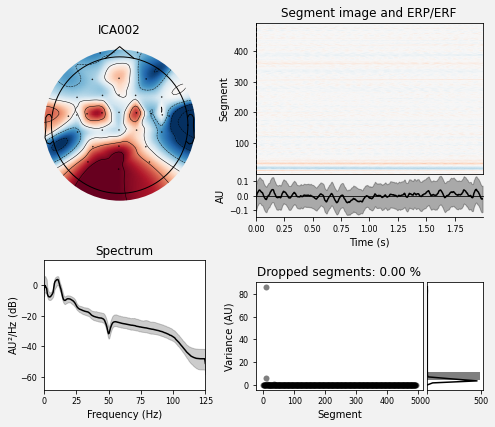

[<Figure size 504x432 with 6 Axes>, <Figure size 504x432 with 6 Axes>]

In [ ]:
ica = mne.preprocessing.ICA(n_components=20, random_state=97, max_iter=800)
ica.fit(raw)
ica.exclude = [1, 2]  # details on how we picked these are omitted here
ica.plot_properties(raw, picks=ica.exclude)

Applying ICA to Raw instance
    Applying projection operator with 1 vector (pre-whitener application)
    Transforming to ICA space (20 components)
    Zeroing out 2 ICA components
    Projecting back using 30 PCA components
Opening raw-browser...


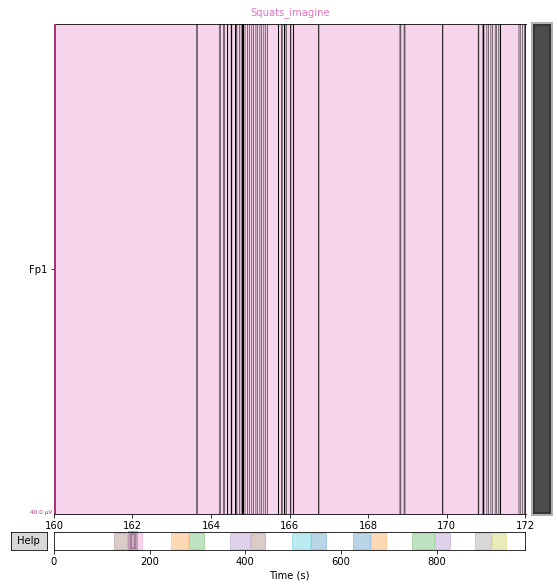

Opening raw-browser...


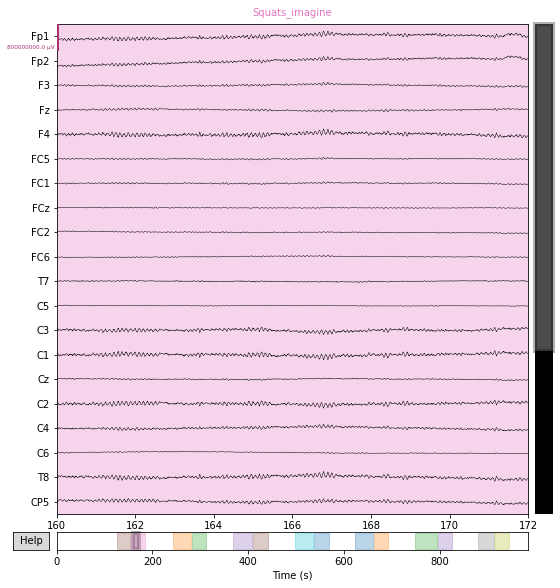

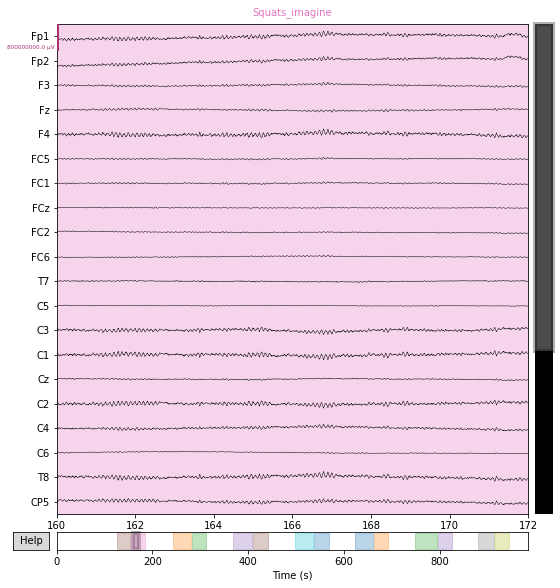

In [ ]:
orig_raw = raw.copy()
raw.load_data()
ica.apply(raw)

# show some frontal channels to clearly illustrate the artifact removal
chs = raw.ch_names
chan_idxs = [raw.ch_names.index(ch) for ch in chs]
orig_raw.plot(order=[0], start=160, duration=12)
raw.plot(order=chan_idxs, start=160, duration=12, scalings=dict(eeg=config.get('constants').get('mne_eeg_scaling')))

Opening raw-browser...


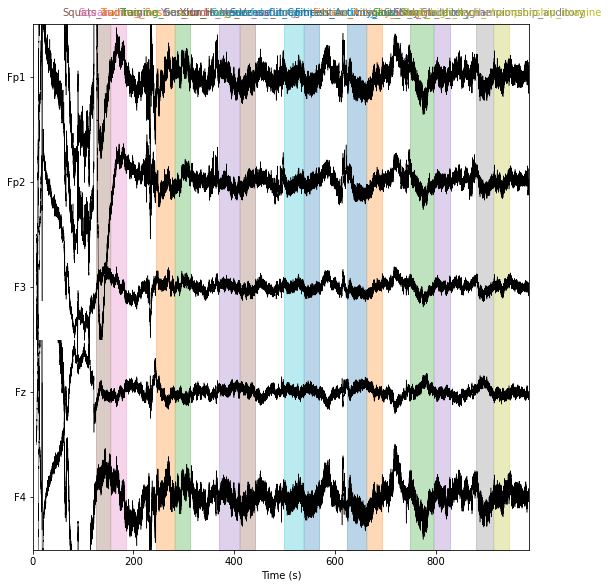

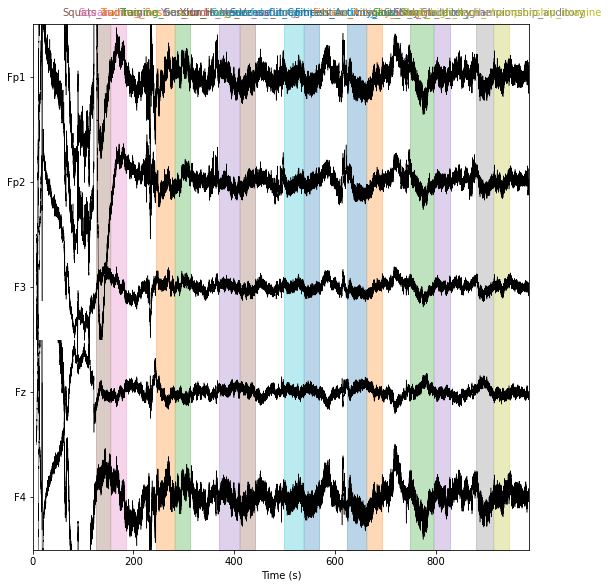

In [ ]:
raw.plot(n_channels=5, show_scrollbars=False, show_scalebars=False, duration=3000, scalings=dict(eeg=config.get('constants').get('mne_eeg_scaling')))